# Data Exploration

In [ ]:
!pip install kmodes

import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from tabulate import tabulate
import seaborn as sns
import numpy as np
import plotly.express as px

# grabs file from public google drive
df = pd.read_csv('https://drive.google.com/uc?export=download&id=1QEGUL9uUTCHCUScu8G5zub_u_JmA25_K')

# Initial data preprocessing

# drop client ID feature and last two Naive Bayes...Month 1 and Month 2 features
df = df.drop('CLIENTNUM', axis=1)
df = df.drop(df.columns[-2:], axis=1)

# Check for any missing values - no missing values found
print('Frequencies of missing values for each feature: ')
print()
if (df.isnull().sum().all() == 0):
  print('No null values')
else:
  print(df.isnull().sum())
print()

Frequencies of missing values for each feature: 

No null values



**Feature Types**

As seen below, there are 6 total categorical features including the target variable Attrition Flag (not included below). Of the 5 categorical features identified, income category appears to be an ordinal discrete variable and education level appears to be a ordinal variable. There are 14 numerical variables identified. Standardization will be needed to resolve the large range discrepencies between numerical variables.



In [ ]:
# Identify categorical variables and their cardinality
categorical_vars = df[df.select_dtypes(include=['object']).columns]

# isolate target variable column and drop the target variable from categorical variables
target_var = df['Attrition_Flag']
categorical_vars = categorical_vars.drop('Attrition_Flag', axis=1)

# Get the unique values for each categorical variable exlcuding the target
categorical_vars_unique_val = {column: categorical_vars[column].unique().tolist() for column in categorical_vars.columns}

table = tabulate(categorical_vars_unique_val, headers='keys', tablefmt='psql')
print(categorical_vars.shape[1],'Categorical Variables: ')
print(table)
print()

# Identify numerical variables
numerical_vars = df[df.select_dtypes(include=['int', 'float']).columns]

print(len(numerical_vars), 'Numerical Variables: ')

table = []
for var in numerical_vars.columns:
    table.append([var, df[var].min(), df[var].max(), df[var].max() - df[var].min()])

print(tabulate(table, headers=["Numerical Variable", "Minimum", "Maximum", "Range"], tablefmt='psql', numalign="left"))

# create separate dfs for discrete and continuous variables for data analysis
discrete_list = ['Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon']
discrete_vars = numerical_vars[discrete_list]
continuous_vars = numerical_vars.drop(discrete_vars.columns, axis=1)

5 Categorical Variables: 
+----------+-------------------+------------------+-------------------+-----------------+
| Gender   | Education_Level   | Marital_Status   | Income_Category   | Card_Category   |
|----------+-------------------+------------------+-------------------+-----------------|
| M        | High School       | Married          | $60K - $80K       | Blue            |
| F        | Graduate          | Single           | Less than $40K    | Gold            |
|          | Uneducated        | Unknown          | $80K - $120K      | Silver          |
|          | Unknown           | Divorced         | $40K - $60K       | Platinum        |
|          | College           |                  | $120K +           |                 |
|          | Post-Graduate     |                  | Unknown           |                 |
|          | Doctorate         |                  |                   |                 |
+----------+-------------------+------------------+-------------------+---

**Feature Summary:**

__

Categorical:

Nominal Variables (3): *Gender, Marital_Status, Card_Category*

Ordinal Variables (2): *Education_Level, Income_Category*

__

Numerical:

Discrete Variables (5): *Dependent_count, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon*

Continuous Variables (10): *Customer_Age, Months_on_book, Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio*

**Target Variable (Attrition Flag)**

As demonstrated by the chart, the target variable is a binary categorical variable. Furthermore, the dataset is highly unbalanced, with the majority class, Existing Customer, representing 83.9% of the dataset and the minority class, Attrited Customer, reprsenting 16.1% of the dataset. Overall, this is a binary class classification

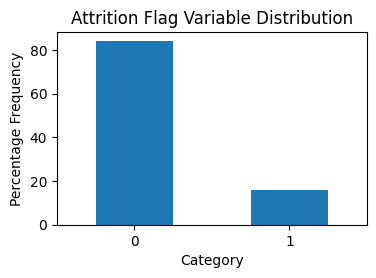

In [ ]:
# Plot distribution of target variable

# Calculate the percentages of existing and attrited customers in the dataset
value_counts = df['Attrition_Flag'].value_counts(normalize=True) * 100

plt.figure(figsize=(4, 2.5))

graph = value_counts.plot.bar(x='Category', y='Percentage Frequency', legend=False)
graph.set_xticklabels(graph.get_xticklabels(), rotation=0)

plt.xlabel('Category')
plt.ylabel('Percentage Frequency')
plt.title('Attrition Flag Variable Distribution')

plt.show()


Categorical Features

Plot categorical features by frequency

As demonstrated below, most of the customers in this dataset are female, graduate, married, make less than 40k and/or hold a blue card level.

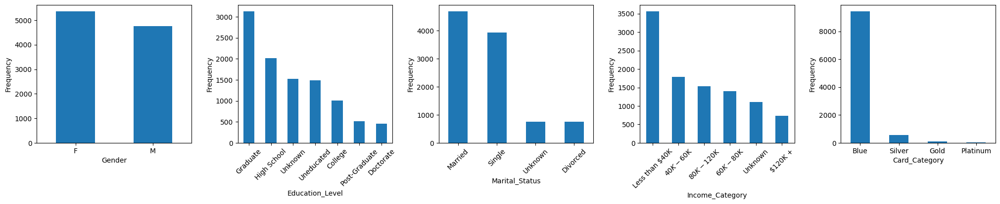

In [ ]:
# Plot categorical features by frequency
plt.figure(figsize=(25, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

for i, var in enumerate(categorical_vars):
    plt.subplot(4, 5, i + 1)
    graph = df[var].value_counts(normalize=False).plot(kind='bar')
    if (var == 'Gender' or var == 'Card_Category'):
      graph.set_xticklabels(graph.get_xticklabels(), rotation=0)
    else:
      graph.set_xticklabels(graph.get_xticklabels(), rotation=45)

    plt.xlabel(var)
    plt.ylabel('Frequency')

plt.show()

Over 10% of education_level data and income_category is unknown, which may need to be filled in if they explain a high degree of variance.

Plot categorical features in comparison to frequency and attrition status

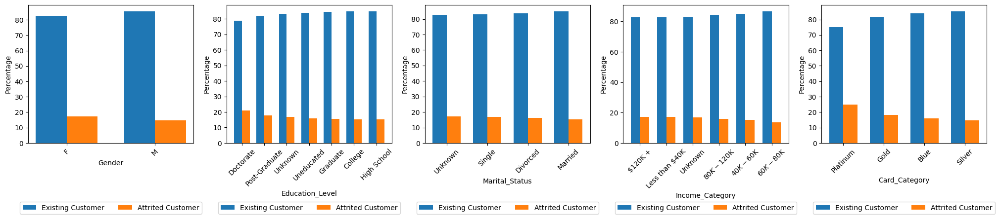

In [ ]:

plt.figure(figsize=(25, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Plot the frequency for each categorical variable as a function of Attrition_Flag
for i, var in enumerate(categorical_vars):
    plt.subplot(4, 5, i + 1)

    counts = df.groupby([var, 'Attrition_Flag']).size().unstack()
    categories = counts.index.tolist()
    categories.sort(key=lambda x: counts.loc[x, 'Existing Customer'] / counts.loc[x].sum())  # Sort based on existing percent

    bar_width = 0.35

    total_counts = counts.sum(axis=1)
    attrited_percent = counts['Attrited Customer'] / total_counts * 100
    existing_percent = counts['Existing Customer'] / total_counts * 100

    labels = ['Existing Customer', 'Attrited Customer']
    x = np.arange(len(categories))

    plt.bar(x - bar_width/2, existing_percent[categories], width=bar_width, label='Existing Customer')
    plt.bar(x + bar_width/2, attrited_percent[categories], width=bar_width, label='Attrited Customer')

    plt.xlabel(var)
    plt.ylabel('Percentage')
    plt.xticks(x, categories, rotation=45)
    plt.legend(loc='upper center', bbox_to_anchor=(.5, -.4), ncol=2)


plt.show()



The bar graphs above reveal that variation of category values is relatively little between exisiting customers and attrited customers, respectively.


*   by a small margin, female customers are more likely to attrite
*   doctoral customers attrite the most followed by post-graduate customers - the rest of the education levels present little variation
*   there is little variation in marital status, but it appears married customers tend to attrite less by a small margin
*   customers in the 60k-80k and 40k-60k income category (middle income) tend to attrite less compared to the highest and lowest income levels
*   the card category feature presents the most variation, with Platinum card category members attriting the most







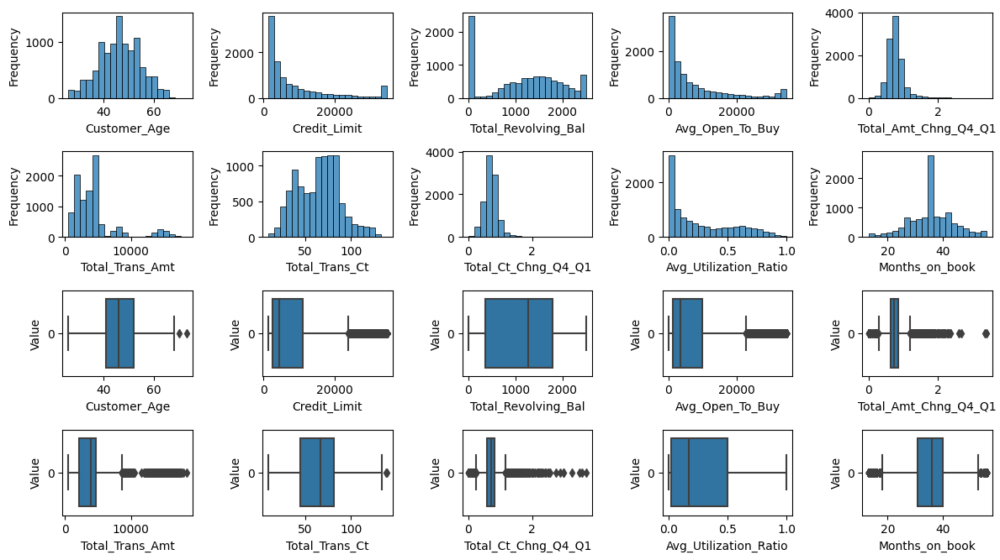

In [ ]:
# Numerical Feature Analysis

plt.figure(figsize=(12, 8))

# create list of variales to plot
# plot months_on_book as a histogram
hist_plots = pd.concat([continuous_vars, df['Months_on_book']], axis=1)

for i, var in enumerate(hist_plots):
    plt.subplot(5, 5, i + 1)
    sns.histplot(hist_plots[var], bins=20, edgecolor='k')
    plt.xlabel(var)
    plt.ylabel('Frequency')

# Create subplots for box plots
for i, var in enumerate(hist_plots):
    plt.subplot(5, 5, i + 1 + len(hist_plots.columns))
    sns.boxplot(hist_plots[var], orient='h')
    plt.xlabel(var)
    plt.ylabel('Value')

plt.tight_layout()
plt.show()

<Figure size 700x700 with 0 Axes>

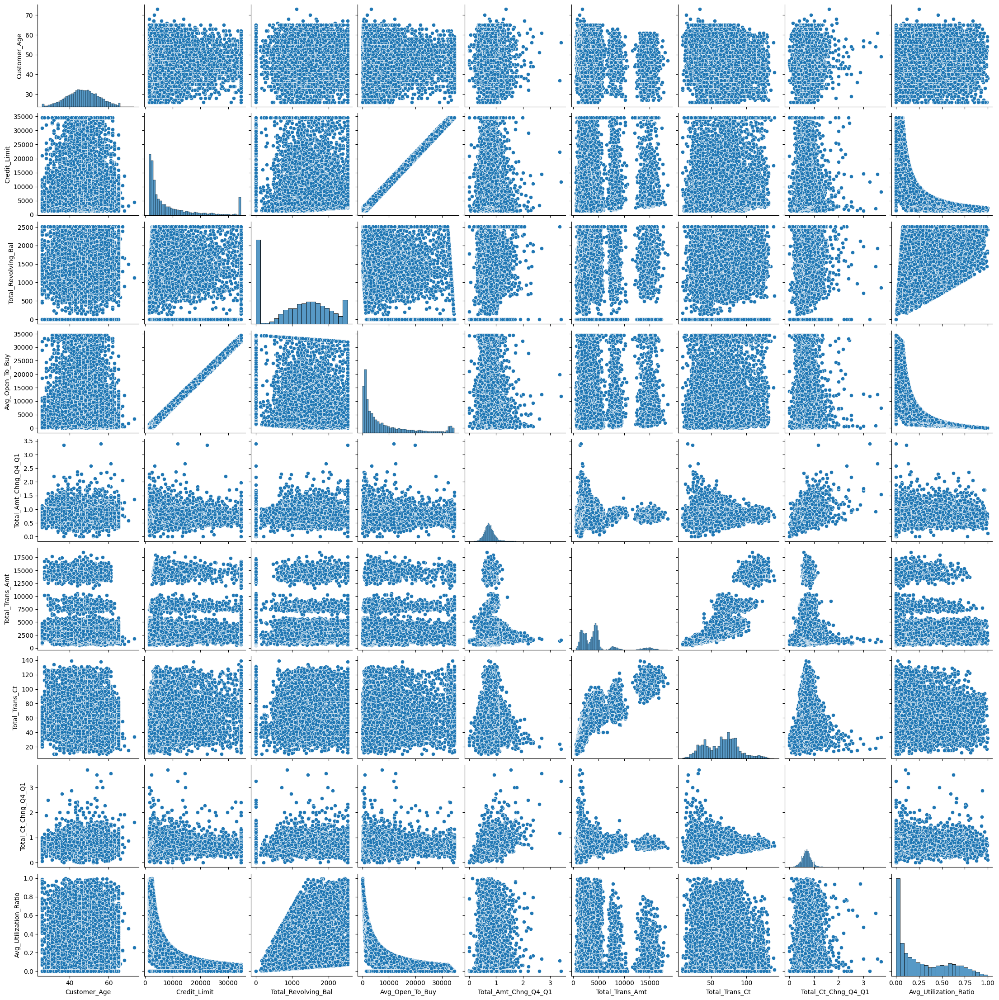

In [ ]:
# plot correlation between all continuous features

plt.figure(figsize=(7, 7))
sns.pairplot(continuous_vars)
plt.show()

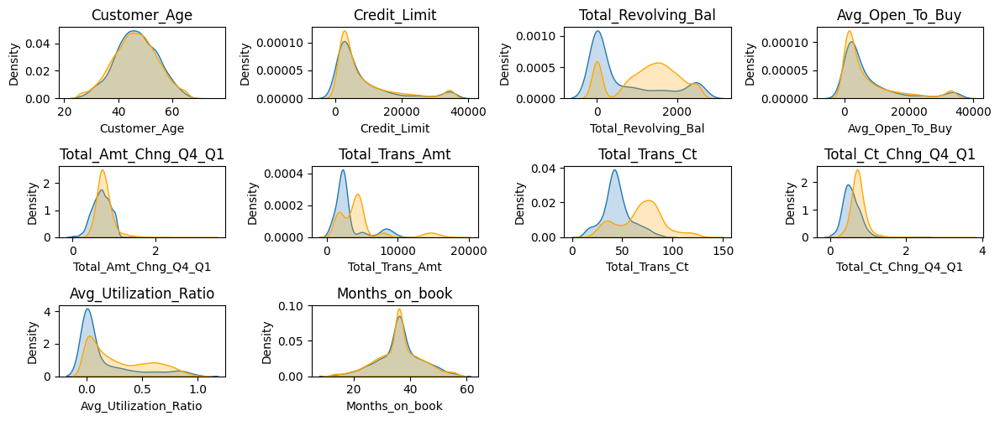

In [ ]:
new_df = pd.concat([hist_plots, target_var], axis=1)
attrited = new_df[new_df['Attrition_Flag'] == 'Attrited Customer']
existing = new_df[new_df['Attrition_Flag'] == 'Existing Customer']

# plot KDE with respect to attrition flag for each variable
plt.figure(figsize=(12, 8))

for i, var in enumerate(hist_plots.columns):
    plt.subplot(5, 4, i + 1)

    sns.kdeplot(data=attrited, x=var, hue=attrited['Attrition_Flag'], fill=True, legend=False)
    sns.kdeplot(data=existing, x=var, hue=existing['Attrition_Flag'], fill=True, legend=False, palette=['orange'])
    plt.title(f'{var}')
    plt.xlabel(var)
    plt.ylabel('Density')

plt.subplots_adjust(left=0.125,   # the left side of the subplots of the figure
                    right=0.9 ,   # the right side of the subplots of the figure
                    bottom=0.1,   # the bottom of the subplots of the figure
                    top=0.9   ,   # the top of the subplots of the figure
                    wspace=0.2,   # the amount of width reserved for blank space between subplots
                    hspace=0.2,   # the amount of height reserved for white space between subplots)
                    )
plt.tight_layout()
plt.show()

# # plot KDE with respect to attrition flag for each variable
# plt.figure(figsize=(12, 8))

# for i, var in enumerate(hist_plots.columns):
#     plt.subplot(5, 4, i + 1)

#     sns.kdeplot(data=hist_plots, x=var, hue=target_var, fill=True, legend=False)

#     plt.title(f'{var}')
#     plt.xlabel(var)
#     plt.ylabel('Density')

# plt.tight_layout()

# plt.show()



*   The density distribution of the attrited customers mirrors that of the existing customers for most features.
*   There are differences in density distribution between attrited and existing customers in total_revolving_bal, total_trans_Ct and total_trans_amt, indicating that these variables may be good indicators of the target



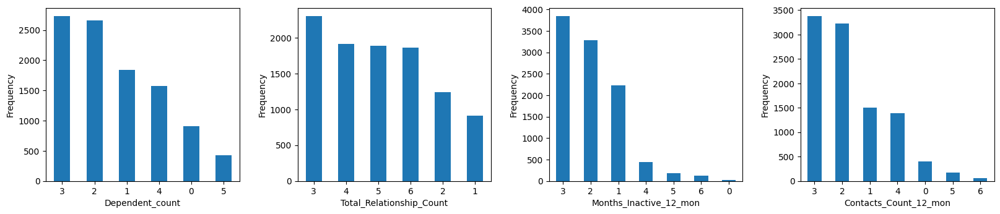

In [ ]:
# Plot discrete numerical variables

plt.figure(figsize=(25, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

disc_plots = discrete_vars.drop('Months_on_book', axis=1)
for i, var in enumerate(disc_plots):
    plt.subplot(4, 5, i + 1)
    graph = df[var].value_counts(normalize=False).plot(kind='bar')
    graph.set_xticklabels(graph.get_xticklabels(), rotation=0)

    plt.xlabel(var)
    plt.ylabel('Frequency')

plt.show()

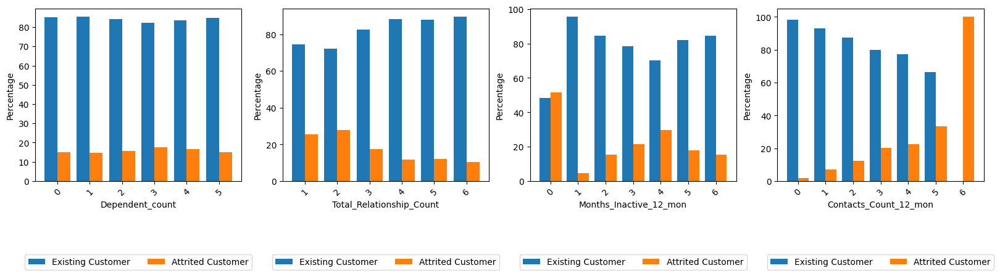

In [ ]:
plt.figure(figsize=(25, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Plot the frequency for each discrete variable as a function of Attrition_Flag
for i, var in enumerate(disc_plots):
    plt.subplot(4, 5, i + 1)

    counts = df.groupby([var, 'Attrition_Flag']).size().unstack()
    categories = counts.index.tolist()
    # categories.sort(key=lambda x: counts.loc[x, 'Existing Customer'] / counts.loc[x].sum())  # Sort based on existing percent

    bar_width = 0.4

    total_counts = counts.sum(axis=1)
    attrited_percent = counts['Attrited Customer'] / total_counts * 100
    existing_percent = counts['Existing Customer'] / total_counts * 100

    labels = ['Existing Customer', 'Attrited Customer']
    x = np.arange(len(categories))

    plt.bar(x - bar_width/2, existing_percent[categories], width=bar_width, label='Existing Customer')
    plt.bar(x + bar_width/2, attrited_percent[categories], width=bar_width, label='Attrited Customer')

    plt.xlabel(var)
    plt.ylabel('Percentage')
    plt.xticks(x, categories, rotation=45)
    plt.legend(loc='upper center', bbox_to_anchor=(.5, -.4), ncol=2)


plt.show()

# Data Preprocessing

## Encoding Categorical Variables

In [ ]:
# Encoding binary  variables
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer': 1, 'Existing Customer': 0})
df['Gender'] = df['Gender'].map({'M': 1, 'F': 0})

# Encoding ordinal variables
df['Income_Category'] = df['Income_Category'].map({'Unknown': 0, 'Less than $40K': 1, '$40K - $60K': 2, '$60K - $80K': 3, '$80K - $120K': 4,'$120K +': 5})
df['Education_Level'] = df['Education_Level'].map({'Unknown': 0, 'Uneducated': 1, 'High School': 2, 'College': 3, 'Graduate': 4, 'Post-Graduate': 5, 'Doctorate': 6})
# df['Card_Category'] = df['Card_Category'].map({"Silver":0, "Blue":1, "Gold":2, "Platinum":3})

# Encoding nominal variables
for var in ['Card_Category', 'Marital_Status']:
# for var in ['Marital_Status']:
    dummies = pd.get_dummies(df[var], prefix=var)
    df = pd.concat([df, dummies], axis=1)
    df = df.drop(var, axis=1)

Number of Variables after Encoding: 26


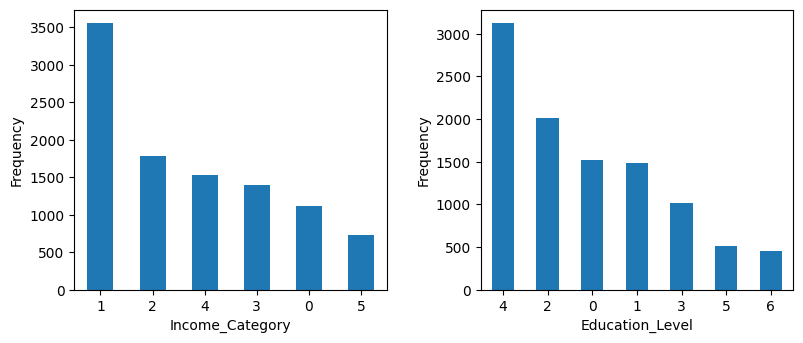

In [ ]:
print("Number of Variables after Encoding:", df.shape[1])
plt.figure(figsize=(25, 20))
plt.subplots_adjust(hspace=0.5, wspace=0.3)

vars_to_plot = ['Income_Category','Education_Level']
plots = df[vars_to_plot]
for i, var in enumerate(plots):
    plt.subplot(4, 5, i + 1)
    graph = df[var].value_counts(normalize=False).plot(kind='bar')
    graph.set_xticklabels(graph.get_xticklabels(), rotation=0)

    plt.xlabel(var)
    plt.ylabel('Frequency')

## Split Dataset

In [ ]:
from sklearn.model_selection import train_test_split

# Split into Train-Test sets
X = df.drop('Attrition_Flag', axis=1)
y = df['Attrition_Flag']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


## Normalization and Upsampling

Normalization

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = MinMaxScaler()

norm_feats = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
norm_X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
norm_X_test = pd.DataFrame(scaler.fit_transform(X_test), columns=X_test.columns, index=X_test.index)

norm_feats.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Income_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
9066,0.636364,0.0,0.2,0.000000,0.0,0.534884,0.0,0.500000,0.500000,0.069071,...,0.182553,0.464464,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5814,0.727273,0.0,0.8,0.333333,0.0,0.813953,0.0,0.666667,0.500000,0.119649,...,0.105816,0.334334,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
792,0.431818,0.0,0.8,0.000000,0.2,0.534884,1.0,0.166667,0.500000,0.439834,...,0.336564,0.103103,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1791,0.181818,0.0,0.4,0.666667,0.2,0.534884,0.6,0.500000,0.666667,0.066108,...,0.350027,0.694695,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5011,0.522727,0.0,0.4,0.333333,0.4,0.604651,0.8,0.500000,0.666667,0.038748,...,0.213786,0.708709,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Upsampling

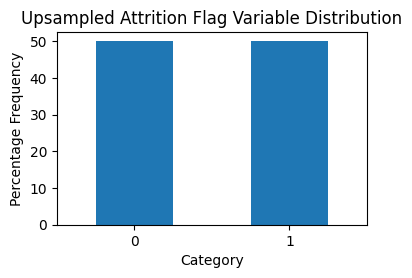

In [ ]:
from imblearn.over_sampling import SMOTENC, ADASYN
'''
X = df.drop('Attrition_Flag', axis=1)
y = df['Attrition_Flag']
'''

# get list of categorical index values to pass into SMOTENC function
df_cat_idx = np.where(df.columns.isin(categorical_vars.columns))[0]

# transform the dataset
oversample = SMOTENC(random_state=42, categorical_features=df_cat_idx.tolist())
smote_X_train, smote_y_train = oversample.fit_resample(X_train, y_train)


# Calculate the percentages of existing and attrited customers in the dataset
value_counts = smote_y_train.value_counts(normalize=True) * 100

plt.figure(figsize=(4, 2.5))

graph = value_counts.plot.bar(x='Category', y='Percentage Frequency', legend=False)
graph.set_xticklabels(graph.get_xticklabels(), rotation=0)

plt.xlabel('Category')
plt.ylabel('Percentage Frequency')
plt.title('Upsampled Attrition Flag Variable Distribution')
plt.show()
# smote_X.assign(Attrition_Flag=smote_y)

# Feature Selection

## Analyzing Features

### Correlation

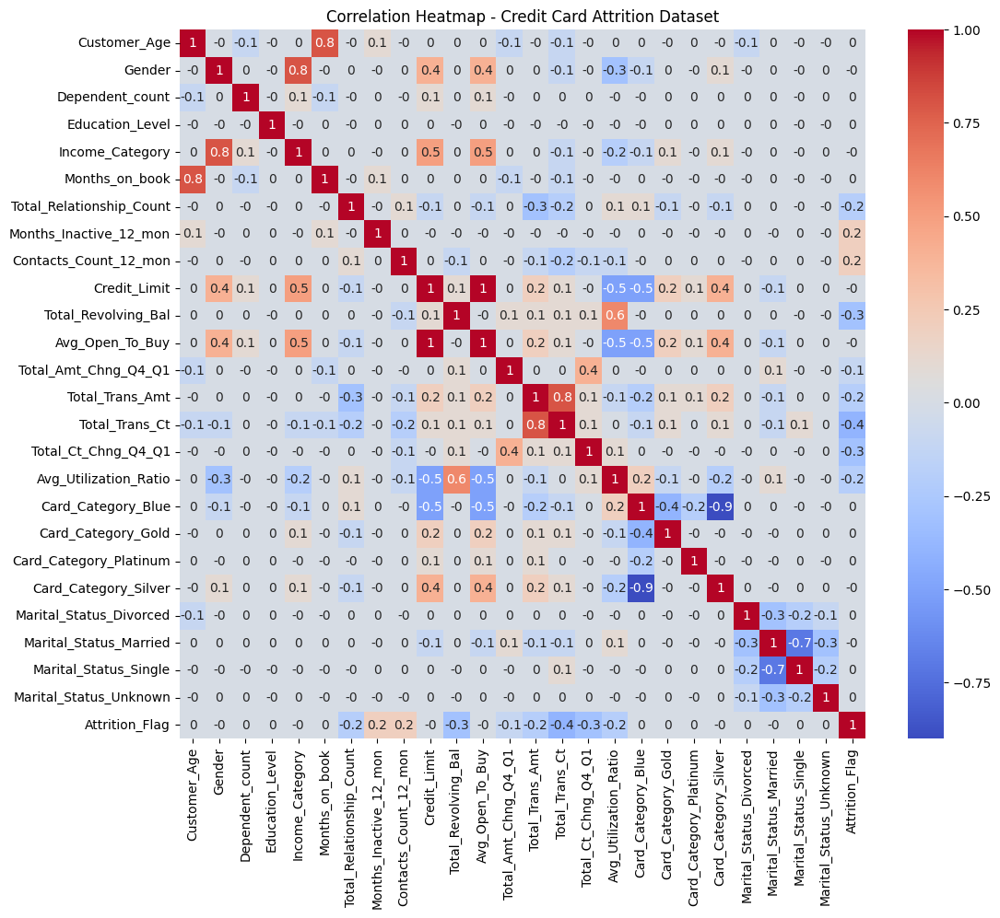

In [ ]:
# create correlation matrix for numerical variables
# Calculate the correlation matrix
corr_matrix = pd.concat([X_train, y_train], axis=1).corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(np.round(corr_matrix,1), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap - Credit Card Attrition Dataset')
plt.show()

Observations of Relationships Between Variables:

*   Credit_Limit and Avg_Open_To_Buy are perfectly positively correlated
*   Customer_Age & Months_on_book as well as Total_Trans_Amt & Total_Trans_Ct are strongly positively correlated
*   As a result of one-hot encoding, Marital_Status_Single and Marital_Status_Divorced are highly correlated. Similarly, Card_Category_Silver and Card_Category_Blue are highly correlated.
*   Income_Category and Gender are also highly correlated.

Pairs to considering dropping one feature of |corr| >= 0.7:
*   Credit_Limit, Avg_Open_To_Buy
*   Customer_Age, Months_on_book
*   Total_Trans_Amt, Total_Trans_Ct
*   Marital_Status_Single, Marital_Status_Divorced
*   Card_Category_Silver, Card_Category_Blue
*   Income_Category, Gender

### NMI

Text(0.5, 1.0, 'Mutual information between features and target averaged over 50 trials')

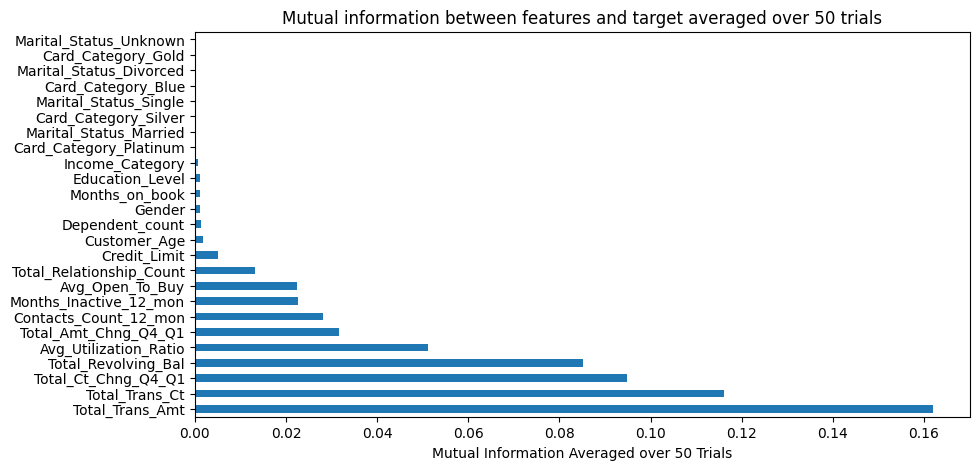

In [ ]:
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression
import matplotlib.pyplot as plt
import seaborn as sns

'''
# Calculate the mutual information between each pair of features (approximate)
mutual_info_matrix = pd.DataFrame(index=X_train.columns, columns=X_train.columns)
entropies = pd.DataFrame(index=X_train.columns, columns=X_train.columns)
for feature1 in X_train.columns:
    for feature2 in X_train.columns:
        mutual_info = mutual_info_regression(X_train[[feature1]], X_train[feature2])[0]
        mutual_info_matrix.loc[feature1, feature2] = mutual_info

# Calculate the normalized mutual information (Theil's uncertainty) between each
# pair of features
norm_mutual_info = mutual_info_matrix.copy()
for feature1 in X_train.columns:
    for feature2 in X_train.columns:
        norm_mutual_info.loc[feature1, feature2] /= .5*(mutual_info_matrix.loc[feature1, feature1] + mutual_info_matrix.loc[feature2, feature2] )
'''

# Calculate the mutual information average between each feature and the target over 10 trials

total_mutual_info = []
disc_cat_vars = X_train.drop(numerical_vars, axis=1).columns
disc_feat_idx = [X_train.columns.get_loc(col) for col in disc_cat_vars]

for _ in range(50):
    # Perform feature selection using mutual_info_classif and obtain the scores
    scores = mutual_info_classif(X_train, y_train, discrete_features=disc_feat_idx)
    total_mutual_info.append(scores)

average_scores = np.mean(total_mutual_info, axis=0)
mutual_info = pd.Series(average_scores)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False).plot.barh(figsize=(10, 5))
plt.xlabel('Mutual Information Averaged over 50 Trials')
plt.title("Mutual information between features and target averaged over 50 trials")





In [ ]:
# get features by average mutual info below a threshold of 0.01

threshold = 0.01
mutual_info_feat_drop = X_train.columns[average_scores < threshold]
mutual_info_feat_drop.tolist()
print("Features with mutual info < 0.002:")

num = 1
for i in mutual_info_feat_drop:
  print(num, i)
  num += 1

Features with mutual info < 0.002:
1 Customer_Age
2 Gender
3 Dependent_count
4 Education_Level
5 Income_Category
6 Months_on_book
7 Credit_Limit
8 Card_Category_Blue
9 Card_Category_Gold
10 Card_Category_Platinum
11 Card_Category_Silver
12 Marital_Status_Divorced
13 Marital_Status_Married
14 Marital_Status_Single
15 Marital_Status_Unknown


### Variance

After further analysis, the two continuous variables with variance below 0.01 (

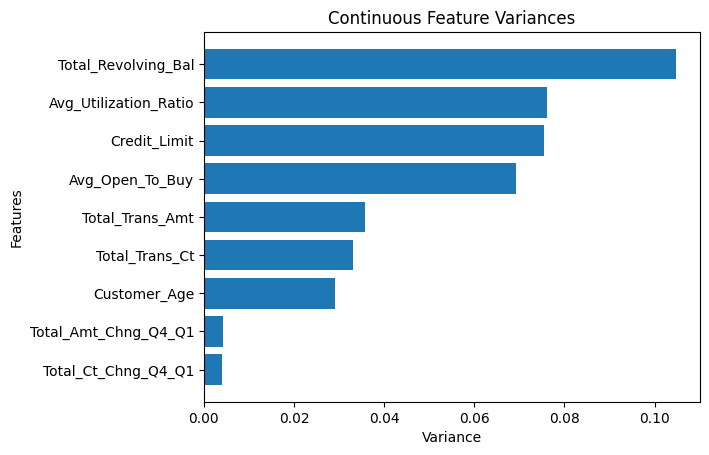


Features with variances below threshold of 0.01: 
Total_Amt_Chng_Q4_Q1
Total_Ct_Chng_Q4_Q1


In [ ]:
from sklearn.feature_selection import VarianceThreshold
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()
norm_feats = pd.DataFrame(scaler.fit_transform(continuous_vars), columns=continuous_vars.columns)

var_thr = VarianceThreshold(threshold = 0.01)
var_thr.fit(norm_feats)

variances = var_thr.variances_
variances_sorted = np.sort(variances)
features_sorted = [continuous_vars.columns[i] for i in np.argsort(variances)]

plt.barh(range(len(continuous_vars.columns)), variances_sorted)
plt.yticks(range(len(continuous_vars.columns)), features_sorted)
plt.xlabel('Variance')
plt.ylabel('Features')
plt.title('Continuous Feature Variances')
plt.show()

cont_feat_var_to_drop = [column for column in continuous_vars.columns if column not in continuous_vars.columns[var_thr.get_support()]]
print()
print('Features with variances below threshold of 0.01: ')
for features in cont_feat_var_to_drop:
    print(features)


### $\chi^2$ test

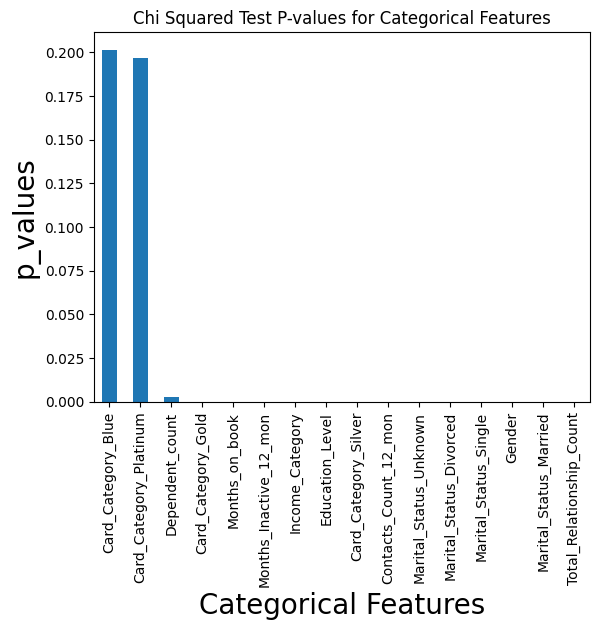

In [ ]:
from sklearn.feature_selection import chi2

# get categorical and discrete vars in train set

smote_X_train_cat = smote_X_train.drop(continuous_vars.columns, axis=1)
chi_scores = chi2(smote_X_train_cat, smote_y_train)

p_values = pd.Series(chi_scores[1],index=smote_X_train_cat.columns)
orig_p_values = p_values
p_values.sort_values(ascending=False, inplace=True)


p_values.plot(kind="bar")
plt.xlabel("Categorical Features",fontsize=20)
plt.ylabel("p_values",fontsize=20)
plt.title("Chi Squared Test P-values for Categorical Features")
plt.show()

In [ ]:
# drop variables that have a p-value above 0.05
print("Categorical Features with p-values >= 0.05:")
print()

alpha = 0.05
print(p_values[p_values >= alpha])

Categorical Features with p-values >= 0.05:

Card_Category_Blue        0.201480
Card_Category_Platinum    0.196706
dtype: float64


## Dropping Variables

In [ ]:
cat_vars_to_drop = ['Card_Category_Blue', 'Card_Category_Platinum']
# cat_vars_to_drop = []

Given the results and the variables considered to drop in each of the metrics, the following 9 variables will be dropped:
*   Avg_Open_To_Buy, Customer Age, Marital_Status_Unknown, Marital_Status_Divorced, Marital_Status_Married, Card_Category_Blue, Card_Category_Gold, Card_Category_Silver, Gender, Dependent_Count



In [ ]:
# dropping variables

features_to_drop = list(set(cat_vars_to_drop + cont_feat_var_to_drop + mutual_info_feat_drop.tolist()))

# creating a separate feature set for random forest
rf_features_to_drop = list(set(cat_vars_to_drop + mutual_info_feat_drop.tolist()))

In [ ]:
# List of variable pairs with |corr| >= 0.7, drop one of each pair
'''
Credit_Limit, Avg_Open_To_Buy
Customer_Age, Months_on_book
Total_Trans_Amt, Total_Trans_Ct (kept both because of high NMI with target)
Marital_Status_Single, Marital_Status_Divorced
Card_Category_Silver, Card_Category_Blue
Income_Category, Gender
'''
# given the pairs above, drop the feature with the lower mutual info with the target

features_to_drop = list(set(features_to_drop + ['Credit_Limit', 'Customer_Age', 'Total_Trans_Ct', 'Marital_Status_Divorced', 'Card_Category_Blue', 'Income_Category']))

print(len(features_to_drop), "features to drop:")
print()

for i in features_to_drop:
  print(i)


18 features to drop:

Marital_Status_Married
Dependent_count
Marital_Status_Unknown
Gender
Total_Amt_Chng_Q4_Q1
Income_Category
Card_Category_Gold
Marital_Status_Divorced
Total_Ct_Chng_Q4_Q1
Months_on_book
Card_Category_Blue
Total_Trans_Ct
Card_Category_Platinum
Education_Level
Credit_Limit
Card_Category_Silver
Customer_Age
Marital_Status_Single


In [ ]:
rf_X_train = X_train.drop(rf_features_to_drop, axis=1)
rf_X_test = X_test.drop(rf_features_to_drop, axis=1)
rf_X_train.columns

Index(['Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Total_Revolving_Bal', 'Avg_Open_To_Buy',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
# drop features
# X_train = X_train.drop(features_to_drop, axis=1)
# X_test = X_test.drop(features_to_drop, axis=1)

X_train = rf_X_train
X_test = rf_X_test

In [ ]:
# list remaining features
print("Number of features after feature selection:", X_train.shape[1])
X_train.head()

Number of features after feature selection: 10


,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9066,1,3,3,1728,1995.0,0.595,8554,99,0.678,0.464
5814,1,4,3,1803,3593.0,0.493,2107,39,0.393,0.334
792,6,1,3,1648,14339.0,0.732,1436,36,1.250,0.103
1791,4,3,4,2517,1108.0,1.158,2616,46,1.300,0.694
5011,5,3,4,1926,794.0,0.602,3806,61,0.794,0.708


In [ ]:
# update continuous_vars to exclude dropped features
continuous_vars = continuous_vars.loc[:, ~continuous_vars.columns.isin(features_to_drop)]

continuous_vars.head()

,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Trans_Amt,Avg_Utilization_Ratio
0,777,11914.0,1144,0.061
1,864,7392.0,1291,0.105
2,0,3418.0,1887,0.000
3,2517,796.0,1171,0.760
4,0,4716.0,816,0.000


# Normalization and Upsampling After Feature Selection

After we finished choosing which feature we are choosing, let's do some normalizing before running PCA to reduce the dimensionality of the dataset on numerical variables or features. First use MinMaxScaler

In [ ]:
# Normalization
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler = MinMaxScaler()


# norm_feats = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index) # this is just an old variable that I didn't want to delete in case anyone is using it - it's the same as norm_X_train
norm_X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
norm_X_test = pd.DataFrame(scaler.fit_transform(X_test), columns=X_test.columns, index=X_test.index)

norm_X_train.head()

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9066,0.0,0.500000,0.500000,0.686532,0.057717,0.222430,0.447535,0.689922,0.182553,0.464464
5814,0.0,0.666667,0.500000,0.716329,0.104019,0.184299,0.088851,0.224806,0.105816,0.334334
792,1.0,0.166667,0.500000,0.654748,0.415380,0.273645,0.051519,0.201550,0.336564,0.103103
1791,0.6,0.500000,0.666667,1.000000,0.032017,0.432897,0.117169,0.279070,0.350027,0.694695
5011,0.8,0.500000,0.666667,0.765197,0.022919,0.225047,0.183376,0.395349,0.213786,0.708709


Then we do SMOTE for upscaling to create a more balanced train set

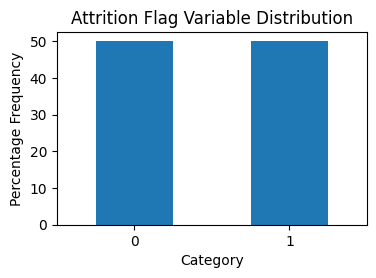

In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN, SMOTETomek

# get list of categorical index values to pass into SMOTENC function
X_train_cat_idx = ~X_train.columns.isin(continuous_vars.columns)

# transform the dataset: SMOTENC applied before normalization
oversample = SMOTETomek()
smote_X_train, smote_y_train = oversample.fit_resample(X_train, y_train)

# transform the dataset: SMOTENC applied after normalization
oversample = SMOTETomek()
norm_smote_X_train, norm_smote_y_train = oversample.fit_resample(norm_X_train, y_train)

# Calculate the percentages of existing and attrited customers in the dataset
value_counts = smote_y_train.value_counts(normalize=True) * 100

plt.figure(figsize=(4, 2.5))

graph = value_counts.plot.bar(x='Category', y='Percentage Frequency', legend=False)
graph.set_xticklabels(graph.get_xticklabels(), rotation=0)

plt.xlabel('Category')
plt.ylabel('Percentage Frequency')
plt.title('Attrition Flag Variable Distribution')
plt.show()
# smote_X.assign(Attrition_Flag=smote_y)

In [ ]:
# additional train set: smotenc and then normalized
smote_norm_X_train = pd.DataFrame(scaler.fit_transform(smote_X_train), columns=smote_X_train.columns, index=smote_X_train.index)

# PCA

Run Linear PCA and Kernel PCA

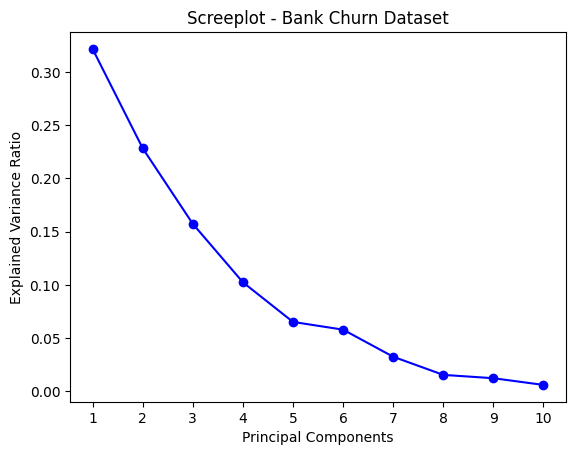

In [ ]:
from sklearn.decomposition import PCA, KernelPCA

# Perform Linear PCA
pca = PCA(10)
X_pca = pca.fit_transform(norm_X_train)
X_pca_test = pca.transform(norm_X_test)

# Perform Kernel PCA
kernel_pca = KernelPCA(n_components=6, kernel='rbf', gamma = 1)
X_kernel_pca = kernel_pca.fit_transform(norm_X_train)
X_kernel_pca_test = kernel_pca.transform(norm_X_test)

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
# k_explained_variance_ratio = np.var(X_kernel_pca, axis=0) / np.sum(np.var(X_kernel_pca, axis=0))

# Plot screeplot
plt.figure()
# plt.plot(range(1, 11), explained_variance_ratio, 'bo-')
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, 'bo-')
# plt.plot(range(1, len(explained_variance_ratio) + 1), k_explained_variance_ratio, 'ro-')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Screeplot - Bank Churn Dataset')
# plt.xticks(range(1, 11))
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.show()

# Clustering

## Continuous clustering

### K-means

In [ ]:
from sklearn.cluster import KMeans

tech_dict = {}

# KMeans
K = 2
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(norm_X_train)
predicted_clusters = kmeans.predict(norm_X_train)
tech_dict['KMeans'] = predicted_clusters

# Linear PCA KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_pca)
predicted_clusters = kmeans.predict(X_pca)
tech_dict['Linear PCA KMeans'] = predicted_clusters

# RBF PCA KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(X_kernel_pca)
predicted_clusters = kmeans.predict(X_kernel_pca)
tech_dict['RBF PCA KMeans'] = predicted_clusters



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


### GMM

In [ ]:
from sklearn.mixture import GaussianMixture

# GMM
K = 2
gmm = GaussianMixture(n_components=K, random_state=42)
gmm.fit(norm_X_train)
predicted_clusters = gmm.predict(norm_X_train)
tech_dict['GMM'] = predicted_clusters

# Linear PCA GMM
gmm = GaussianMixture(n_components=K, random_state=42)
gmm.fit(X_pca)
predicted_clusters = gmm.predict(X_pca)
tech_dict['Linear PCA GMM'] = predicted_clusters

# RBF PCA GMM
gmm = GaussianMixture(n_components=K, random_state=42)
gmm.fit(X_kernel_pca)
predicted_clusters = gmm.predict(X_kernel_pca)
tech_dict['RBF PCA GMM'] = predicted_clusters

### Agglomerative

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Single-Link Agglomerative
K = 2
slhier = AgglomerativeClustering(n_clusters=K, linkage="single")
slhier.fit(norm_X_train)
predicted_clusters = slhier.labels_
tech_dict['Single Link Aggl.'] = predicted_clusters

# Linear PCA Single Link Aggl.
slhier = AgglomerativeClustering(n_clusters=K, linkage="single")
slhier.fit(X_pca)
predicted_clusters = slhier.labels_
tech_dict['Linear PCA Single Link Aggl.'] = predicted_clusters

# RBF PCA Single Link Aggl.
slhier = AgglomerativeClustering(n_clusters=K, linkage="single")
slhier.fit(X_kernel_pca)
predicted_clusters = slhier.labels_
tech_dict['RBF PCA Single Link Aggl.'] = predicted_clusters

In [ ]:
# Complete-Link Agglomerative
K = 2
clhier = AgglomerativeClustering(n_clusters=K, linkage="complete")
clhier.fit(norm_X_train)
predicted_clusters = clhier.labels_
tech_dict['Complete Link Aggl.'] = predicted_clusters

# Linear PCA Complete Link Aggl.
clhier = AgglomerativeClustering(n_clusters=K, linkage="complete")
clhier.fit(X_pca)
predicted_clusters = clhier.labels_
tech_dict['Linear PCA Complete Link Aggl.'] = predicted_clusters

# RBF PCA Complete Link Aggl.
clhier = AgglomerativeClustering(n_clusters=K, linkage="complete")
clhier.fit(X_kernel_pca)
predicted_clusters = clhier.labels_
tech_dict['RBF PCA Complete Link Aggl.'] = predicted_clusters

Evaluation for MinMaxScaler

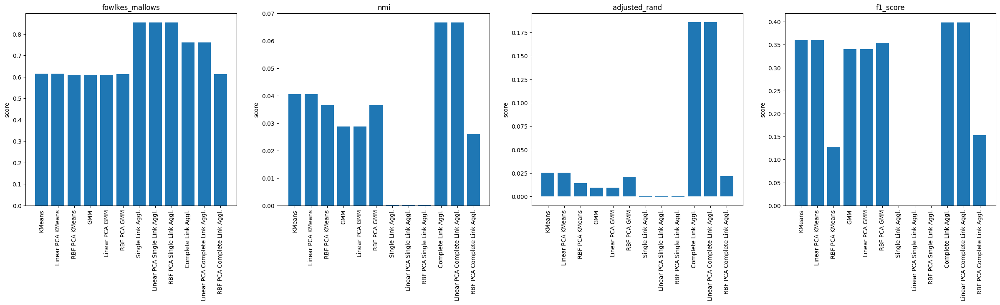

In [ ]:
from sklearn.metrics import fowlkes_mallows_score, adjusted_rand_score, normalized_mutual_info_score, davies_bouldin_score, silhouette_score, recall_score, accuracy_score, f1_score
plt.figure(figsize=(30, 6))
evaluation_metrics = {'fowlkes_mallows':[], 'nmi':[], 'adjusted_rand':[], 'f1_score': []}
for (technique,labels_pred) in tech_dict.items():
    evaluation_metrics['f1_score'] += [f1_score(y_train, labels_pred)]
    evaluation_metrics['fowlkes_mallows'] += [fowlkes_mallows_score(y_train, labels_pred) ]
    evaluation_metrics['nmi'] += [normalized_mutual_info_score(y_train, labels_pred)]
    evaluation_metrics['adjusted_rand'] +=  [adjusted_rand_score(y_train, labels_pred)]

id = 1
for (eval, metric) in evaluation_metrics.items():
    plt.subplot(int("14"+str(id)))
    plt.title('eval')
    plt.bar(tech_dict.keys(), metric)
    plt.xticks(rotation='vertical')
    plt.title(eval)
    plt.ylabel('score')
    id += 1

plt.show()

## K-Modes

In [ ]:
from kmodes.kprototypes import KPrototypes
keep_feats = X.columns[average_scores > 0.02]

In [ ]:
# X_nmi = X[list(keep_feats) + list(disc_cat_vars)]
# X_nmi_train, X_nmi_test, y_nmi_train, y_nmi_test = train_test_split(X_nmi, y, test_size=0.2, random_state=42)

In [ ]:
# kp = KPrototypes(n_clusters=2)
# kp.fit(X_nmi_train)
# preds = kp.predict(X_nmi_test)

# Clustering Evaluation

### Visualizations

We can visualize the original and predicted clusters using two continuous features:

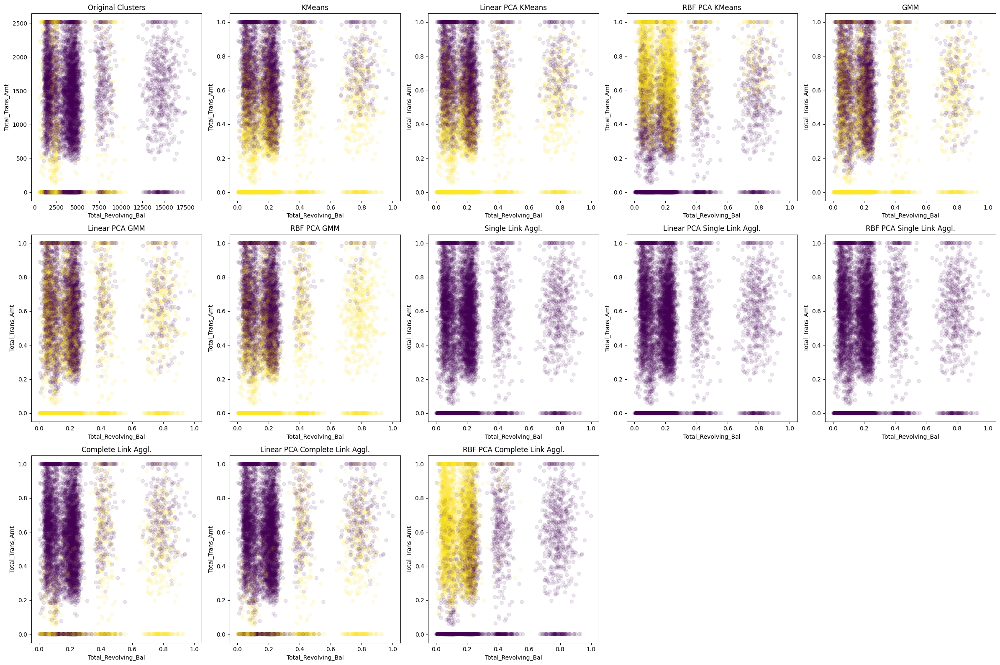

In [ ]:
cols = X_train.columns
f1n, f2n = 3, 6
feat1, feat2 = cols[f2n], cols[f1n]

plt.figure(figsize=(24, 16))
plt.subplot(351)
plt.scatter(X_train[feat1], X_train[feat2], c=y_train, cmap='viridis', alpha = 0.1)
plt.title('Original Clusters')
plt.xlabel(cols[f1n])
plt.ylabel(cols[f2n])
plt.show

id = 2
for (technique,cluster_pred) in tech_dict.items():
    plt.subplot(3,5,id)
    plt.scatter(norm_X_train[feat1], norm_X_train[feat2], c=cluster_pred, cmap='viridis', alpha = 0.1)
    plt.title(technique)
    plt.xlabel(cols[f1n])
    plt.ylabel(cols[f2n])
    id += 1

plt.tight_layout()
plt.show()

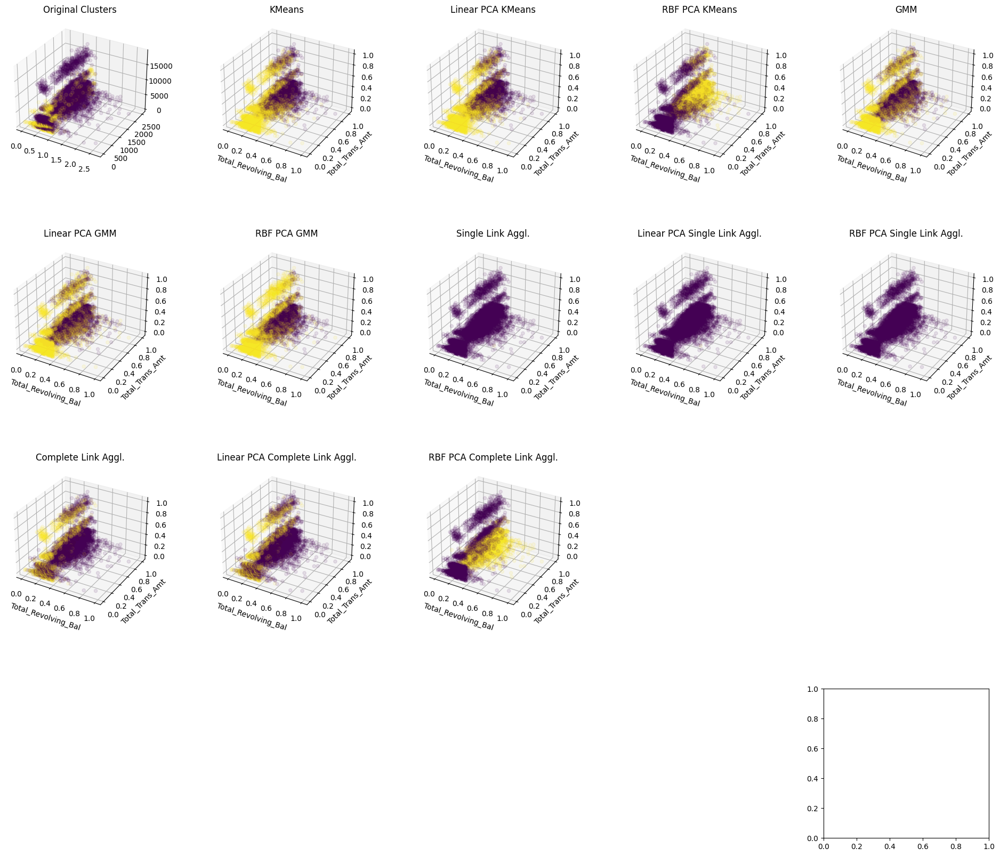

In [ ]:
feat1, feat2, feat3 = cols[5], cols[3], cols[6]

pdfx = X_train[feat1]
pdfy = X_train[feat2]
pdfz = X_train[feat3]

# fig = plt.figure()
fig = plt.figure(figsize=(24, 20))
ax = plt.subplot(451, projection='3d')
ax.scatter3D(pdfx, pdfy, pdfz, c=y_train, cmap='viridis', alpha = 0.1)
plt.title('Original Clusters')
# plt.xlabel(cols[f1n])
# plt.ylabel(cols[f2n])
# plt.show
# plt.legend([0, 1],["Existing", "Attrited"])
id = 2
for (technique,cluster_pred) in tech_dict.items():
    ax = plt.subplot(4,5,id, projection='3d')
    # plt.subplot(2,7,id)
    ax.scatter(norm_X_train[feat1], norm_X_train[feat2], norm_X_train[feat3], c=cluster_pred, cmap='viridis', alpha = 0.1)
    plt.title(technique)
    plt.xlabel(cols[f1n])
    plt.ylabel(cols[f2n])
    id += 1
ax = plt.subplot(4,5,20)
plt.title("")
# fig.subplots_adjust(bottom=-0.5) # or whatever
# plt.subplots_adjust(bottom=0.1, right=0.8, left=0.1, top=0.9)
plt.subplots_adjust(wspace=0.25, hspace=0.5)
# plt.tight_layout()
plt.show()

### Clustering Metrics

We can't visually evaluate clustering quality due to the complexity of the problem. We can instead evaluate the quality of our clustering by using external and internal measures.

<ipython-input-65-a81abea0ceec>:17: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,8,id)


<Figure size 16000x16000 with 0 Axes>

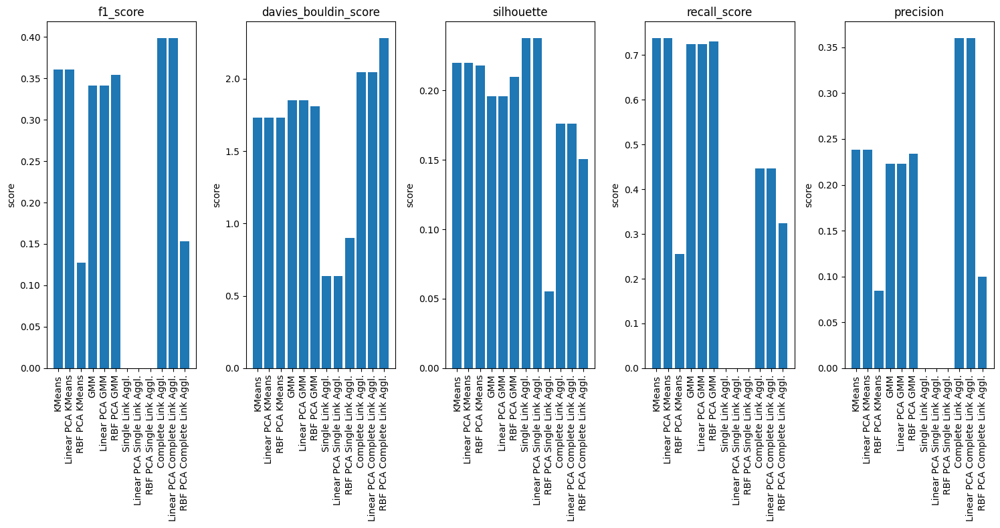

In [ ]:
from sklearn.metrics import davies_bouldin_score, silhouette_score, recall_score, precision_score, f1_score
plt.figure(figsize=(160, 160))
evaluation_metrics = {'f1_score':[], 'davies_bouldin_score':[], 'silhouette': [] , 'recall_score': [], 'precision':[]}
for (technique,labels_pred) in tech_dict.items():
    # evaluation_metrics['f1_score'] += [f1_score(smote_y_train, labels_pred)]
    evaluation_metrics['f1_score'] += [f1_score(y_train, labels_pred)]
    evaluation_metrics['davies_bouldin_score'] += [davies_bouldin_score(norm_X_train, labels_pred)]
    evaluation_metrics['silhouette']  += [silhouette_score(norm_X_train, labels_pred)]
    # evaluation_metrics['precision'] += [precision_score(smote_y_train, labels_pred)]
    evaluation_metrics['precision'] += [precision_score(y_train, labels_pred)]
    # evaluation_metrics['recall_score'] += [recall_score(smote_y_train, labels_pred)]
    evaluation_metrics['recall_score'] += [recall_score(y_train, labels_pred)]

plt.subplots(figsize=(24, 8))
id = 1
for (eval, metric) in evaluation_metrics.items():
    plt.subplot(1,8,id)
    plt.title('eval')
    plt.bar(tech_dict.keys(), metric)
    plt.xticks(rotation='vertical')
    plt.title(eval)
    plt.ylabel('score')
    id += 1

plt.tight_layout()
plt.show()

## Confusion Matrices

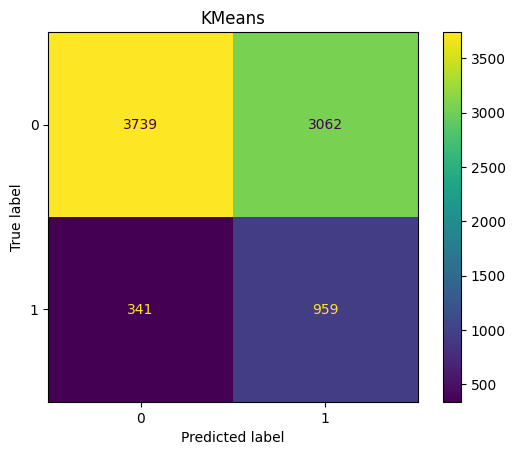

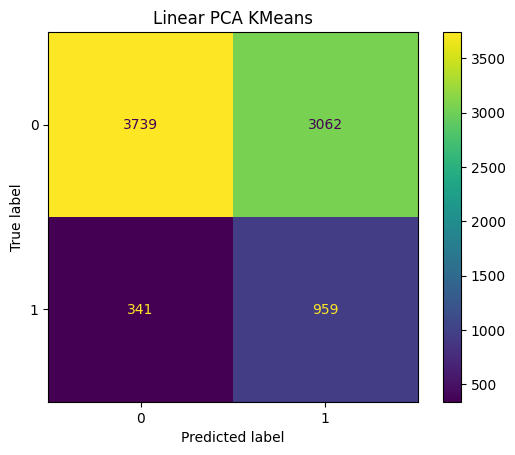

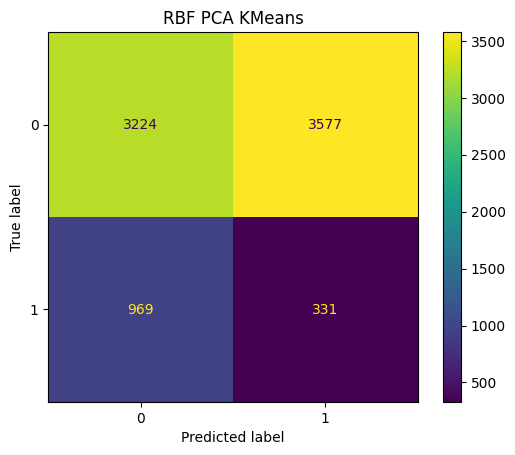

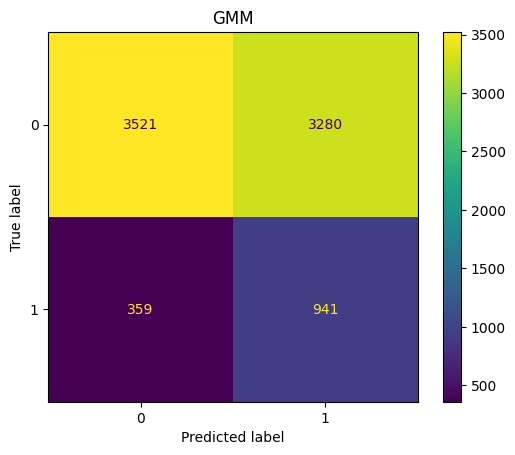

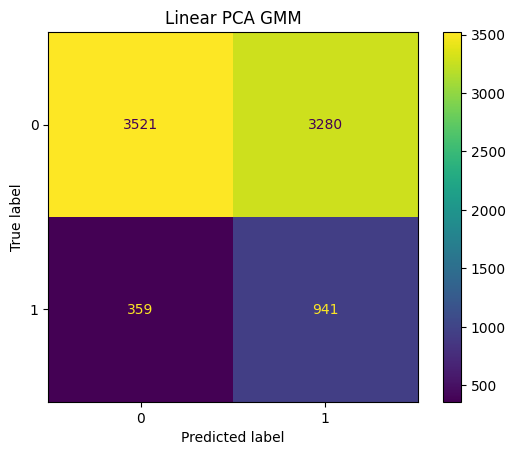

...

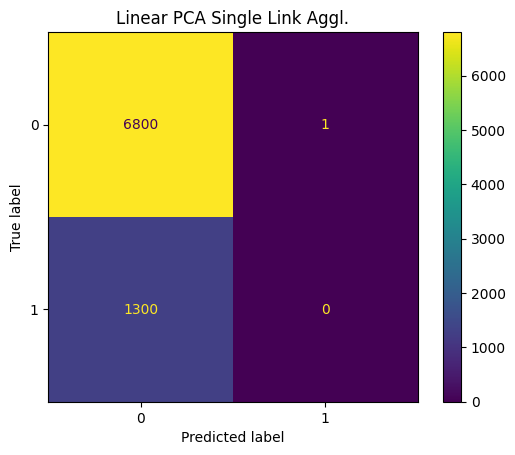

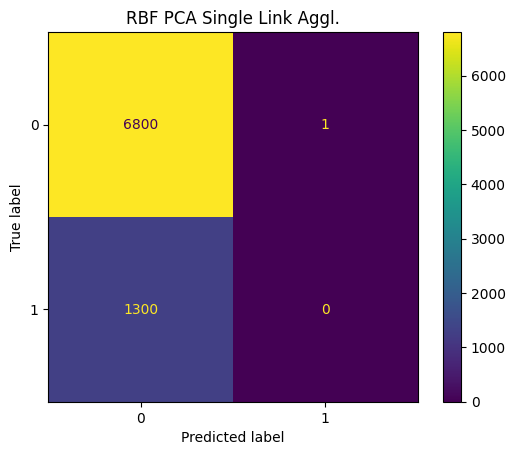

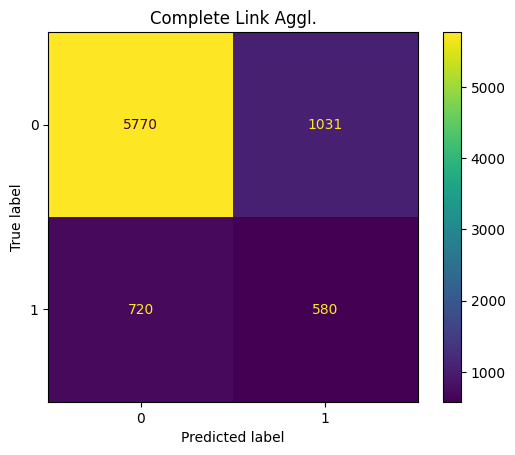

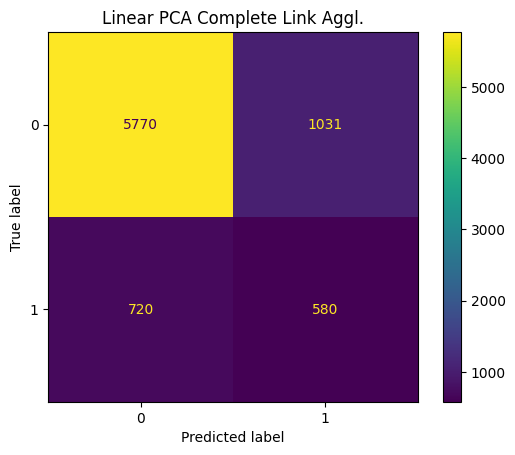

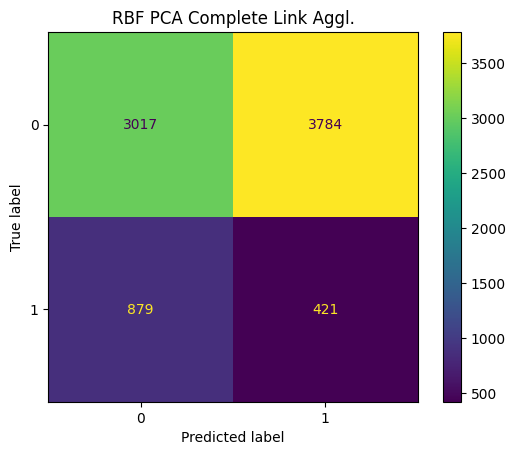

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
evaluation_metrics = {'confusion matrix': []}
for (technique,labels_pred) in tech_dict.items():
  # cm = confusion_matrix(smote_y_train, labels_pred)
  cm = confusion_matrix(y_train, labels_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm)
  disp.plot()
  disp.ax_.set_title(str(technique))

Observations:
*   Linear PCA K-Means has the highest F1 score
*   List item



# Supervised Learning

Models to use:

- Neural Network
- Kernel SVM
- Gradient Boosted Trees
- Random Forest
- Logistic Regression




## Neural Network

For neural networks, we'll be using SKLearn's multilayer perceptron classifier. This is model with lots of hyperparameters, so we'll be briefly testing a little bit of everything. For each model, we will evaluate performance using an overall f1 score between the true labels and predicted labels.

In [ ]:
"""
Schema for SL technique:
{
    name: <model name>,
    X: <features tested on>,
    y: <testing labels>,
    yhat: <model predictions>,
}
"""


'\nSchema for SL technique:\n{\n    name: <model name>,\n    X: <features tested on>,\n    y: <testing labels>,\n    yhat: <model predictions>,\n}\n'

### Layer sizes

Layer sizes has a lot of possibilities. Not all tested layer sizes have been shown, but here, we show 3 examples of differing layer widths and depths.

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(layers):
    mlp = MLPClassifier(hidden_layer_sizes=layers, activation="tanh")
    mlp.fit(smote_norm_X_train, smote_y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "Neural network " + str(layers),
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

archs = [
    (150),
    (100, 40, 10),
    (50, 25, 15, 15, 15, 5, 5, 5),
]

sl_tech_list += [nn_make(layers) for layers in archs]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


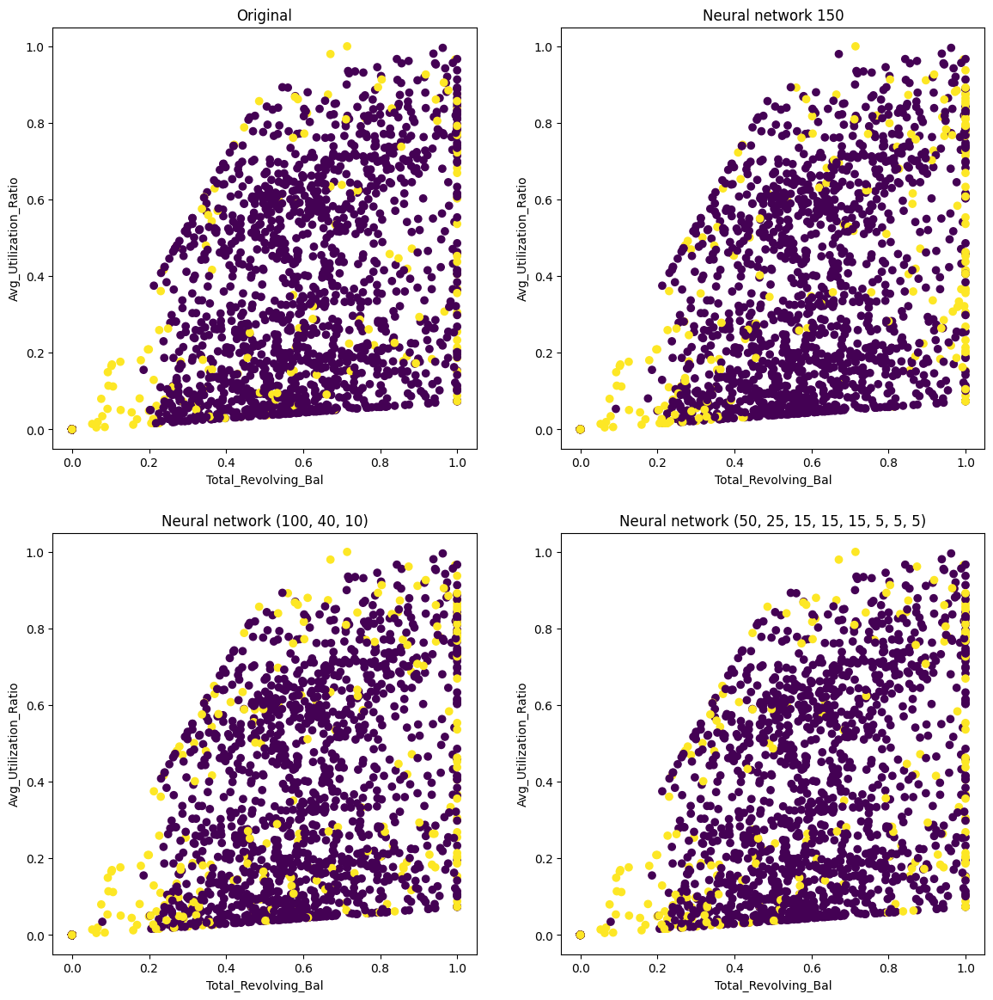

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,2,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,2,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1


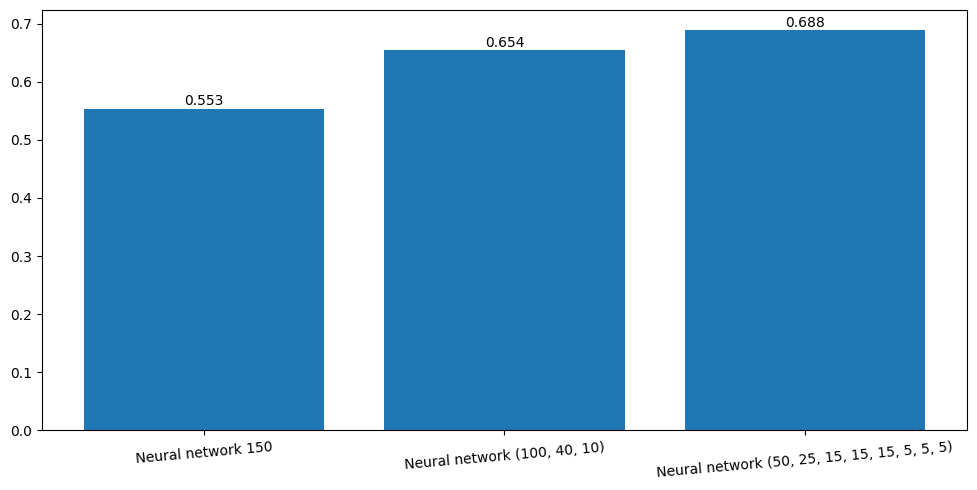

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

### Activation Functions

RelU and Tanh seem to vastly outperform logistic, likely because these functions tend to converge faster and don't suffer as much from the vanishing gradient effect. We'll pick Tanh going forward as the activation function:

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_act(activation):
    layers = (25, 25, 25, 15, 15, 15, 5, 5, 5)
    mlp = MLPClassifier(hidden_layer_sizes=layers, activation=activation)
    mlp.fit(smote_norm_X_train, smote_y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "Neural network " + activation,
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

archs = [
    "tanh",
    "relu",
    "logistic"
]

sl_tech_list += [nn_act(acts) for acts in archs]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


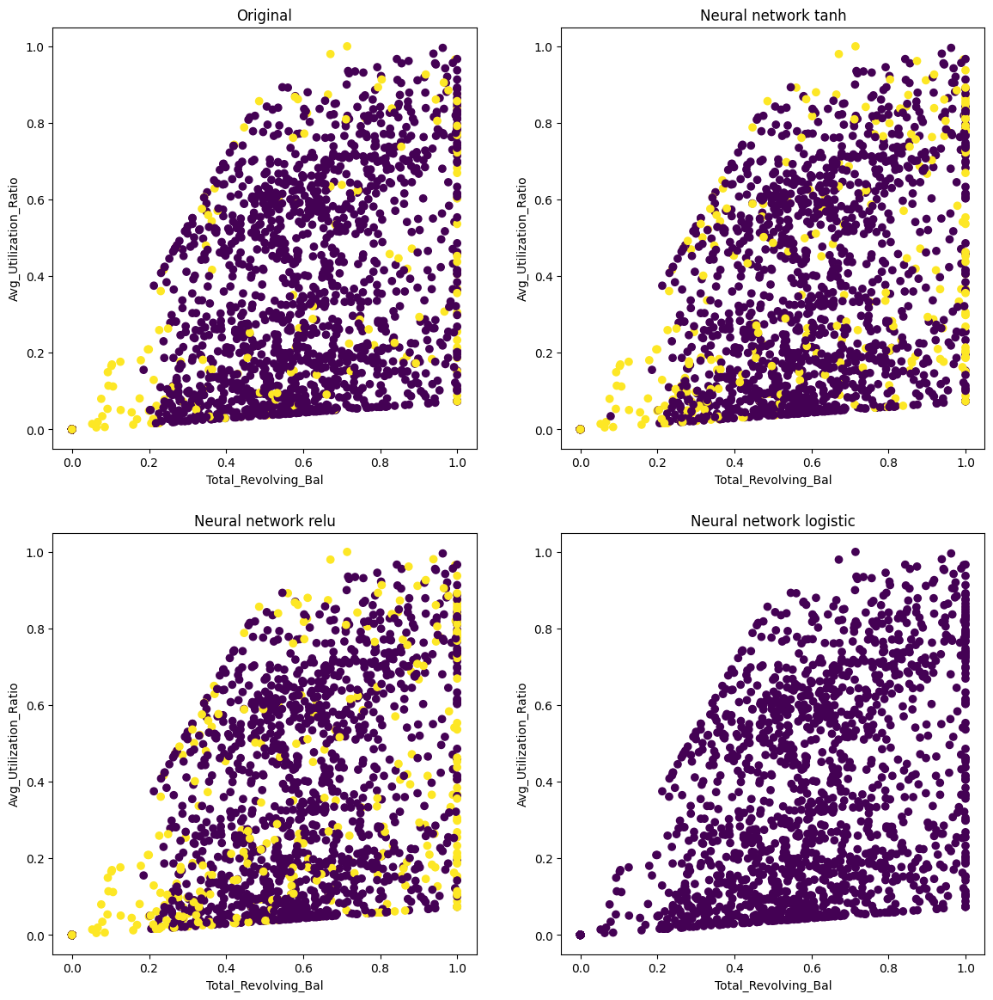

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,2,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,2,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1


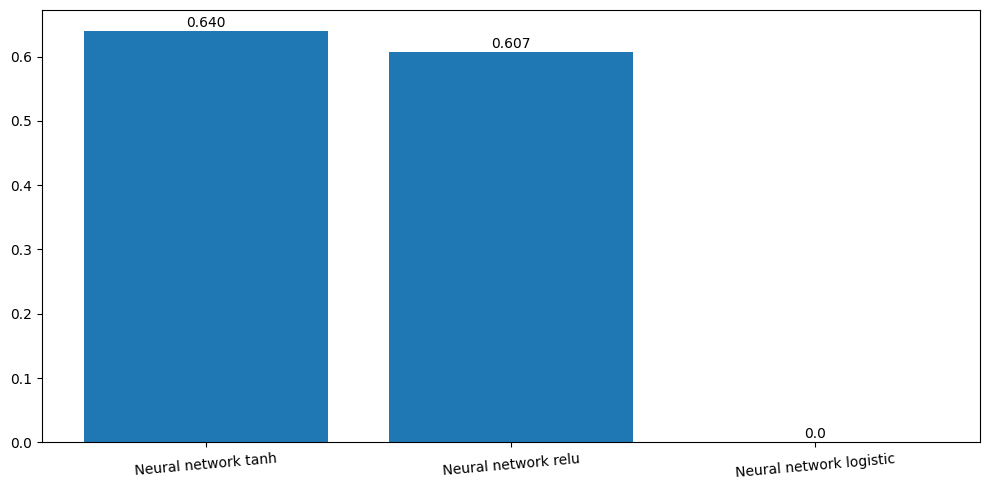

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

### Solver

Although lbfgs and SGD have shown good results in our testing, Adam seems to be the most consistent at training our model with a good f1 score.

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(solver):
    mi = 1000 if solver == "lbfgs" else 200
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5),
                        activation="tanh",
                        solver=solver,
                        max_iter=mi)
    mlp.fit(smote_norm_X_train, smote_y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "Neural network " + solver,
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

archs = [
    "sgd", "adam", "lbfgs"
]

sl_tech_list += [nn_make(layers) for layers in archs]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


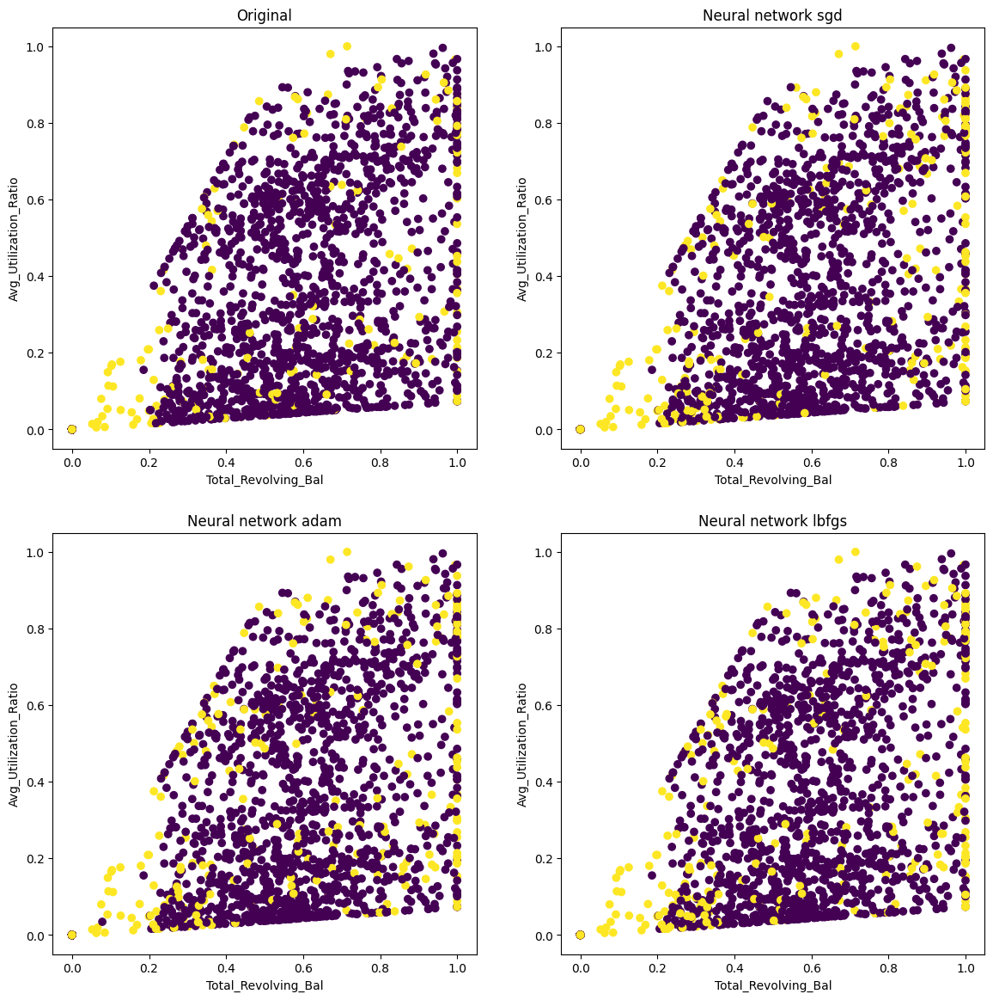

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,2,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,2,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1

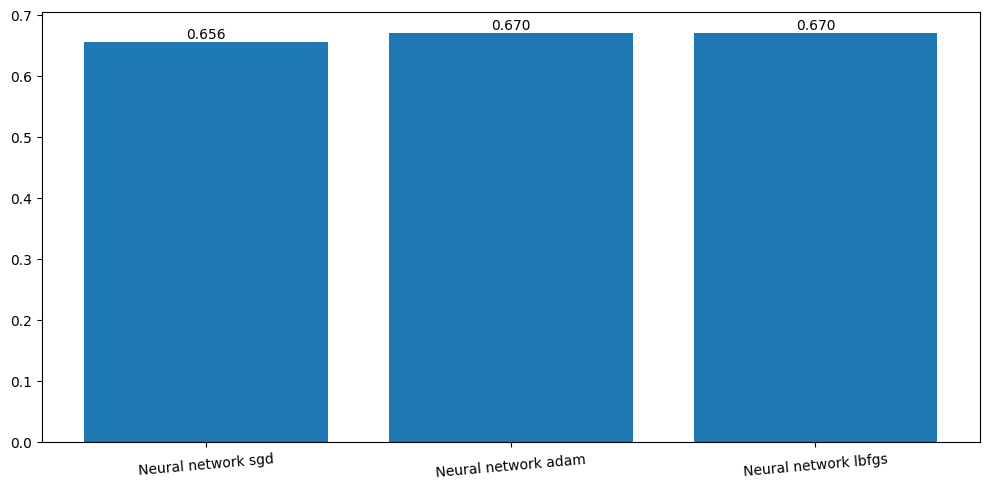

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

### Learning rate

We test different learning rates and their effect on the performance of the SGD solver, in case anything drastic pops up. We find that constant learning rates are very close in performance to adaptive learning rates. Using the inverse-scaling learning rate would probably require more tuning of parameters to get right, so we avoid that. Ultimately, a constant learning rate seems to be good enough.

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(learning_rate):
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5),
                        activation="tanh",
                        solver="sgd",
                        learning_rate=learning_rate)
    mlp.fit(smote_norm_X_train, smote_y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "Neural network LR: " + learning_rate,
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

archs = [
    "constant", "invscaling", "adaptive"
]

sl_tech_list += [nn_make(layers) for layers in archs]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


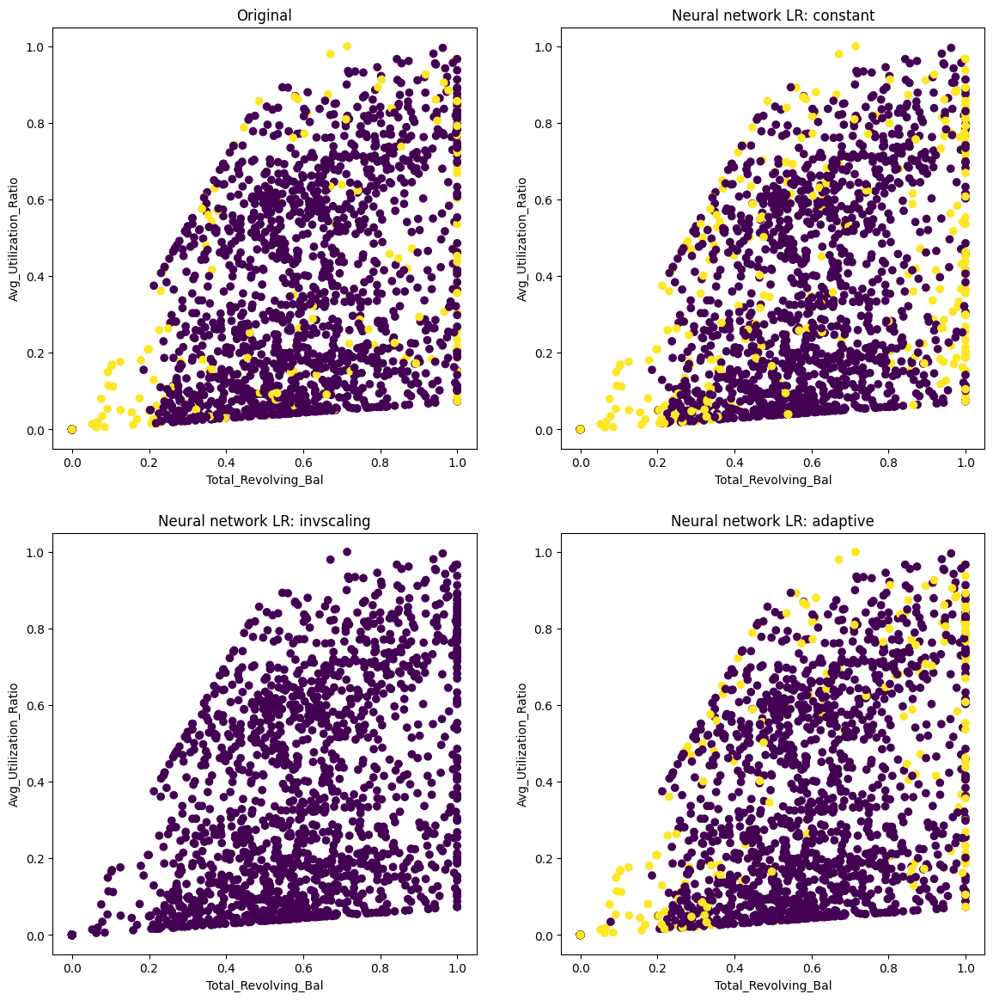

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,2,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,2,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1

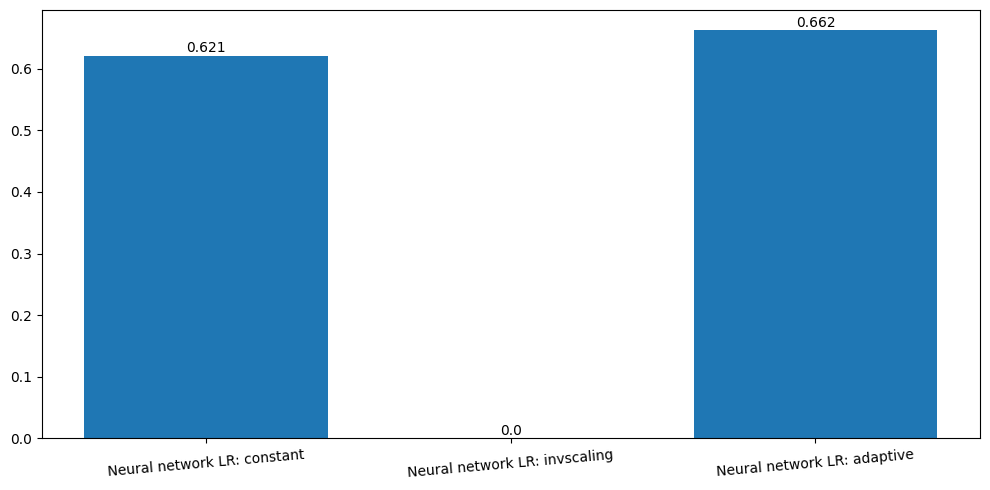

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

### Dataset

Here, we check to see if normalization and upsampling has any effects on the performance of our model. We also throw in testing kernel PCA to see if our model can benefit from that (it didn't). Ultimately, it seems normalization but not upsampling helps the model perform best.

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(data):
    trainX, trainy, testX, name = data
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5),
                        activation="tanh",)
    print(name)
    mlp.fit(trainX, trainy)
    preds = mlp.predict(testX)
    return {
        "name": "Neural network " + name,
        "X": testX,
        "y": y_test,
        "yhat": preds,
    }

datas = [
    (X_train, y_train, X_test, "No processing"),
    (norm_X_train, y_train, norm_X_test, "Normalized"),
    (smote_norm_X_train, smote_y_train, norm_X_test, "Upsampled+normalized"),
    (norm_smote_X_train, norm_smote_y_train, norm_X_test, "Normalized+upsampled"),
    (X_kernel_pca, y_train, X_kernel_pca_test, "Kernel PCA"),
]

sl_tech_list += [nn_make(data) for data in datas]

No processing
Normalized
Upsampled+normalized
Normalized+upsampled


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Kernel PCA


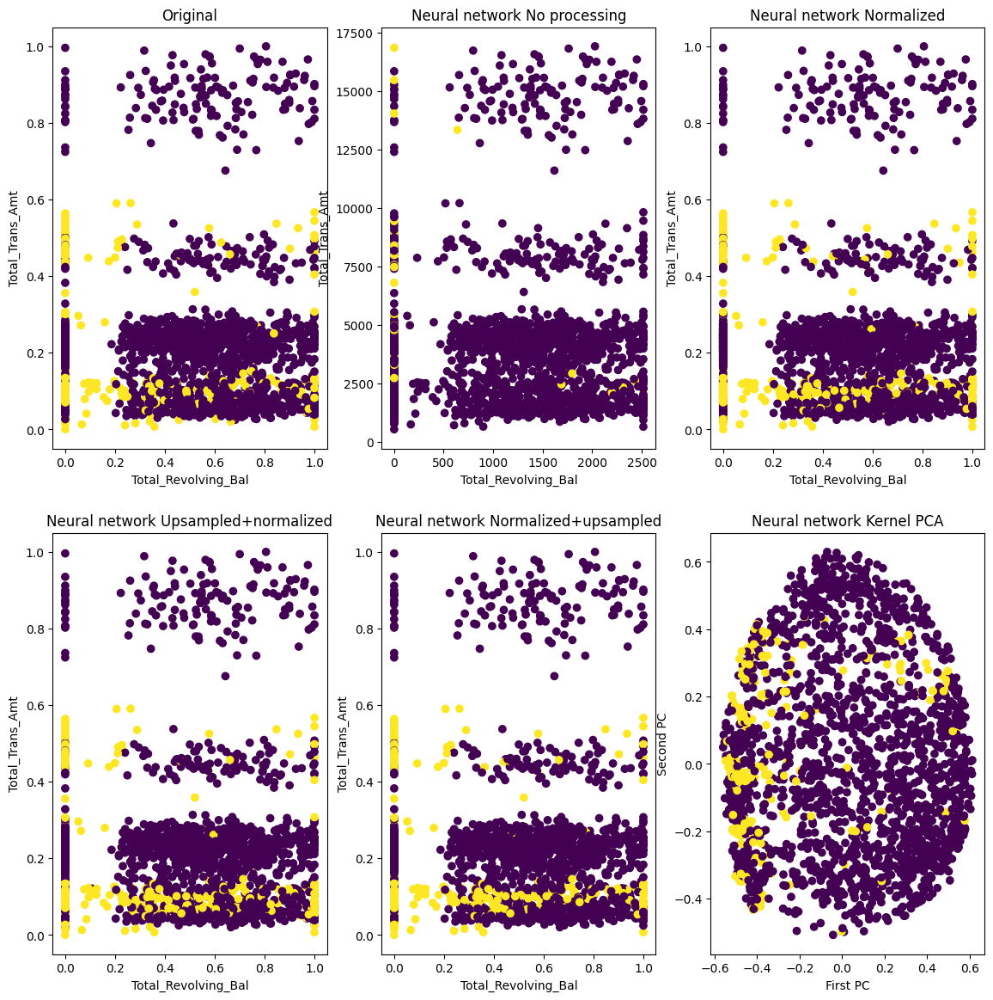

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,3,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,3,count)
    plt.title(tech["name"])
    if (type(tech["X"]) == np.ndarray):
        plt.xlabel("First PC")
        plt.ylabel("Second PC")
        plt.scatter(tech["X"][:,0], tech["X"][:,1], c=tech["yhat"])
    else:
        plt.xlabel(tech["X"].columns[3])
        plt.ylabel(tech["X"].columns[6])
        plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1

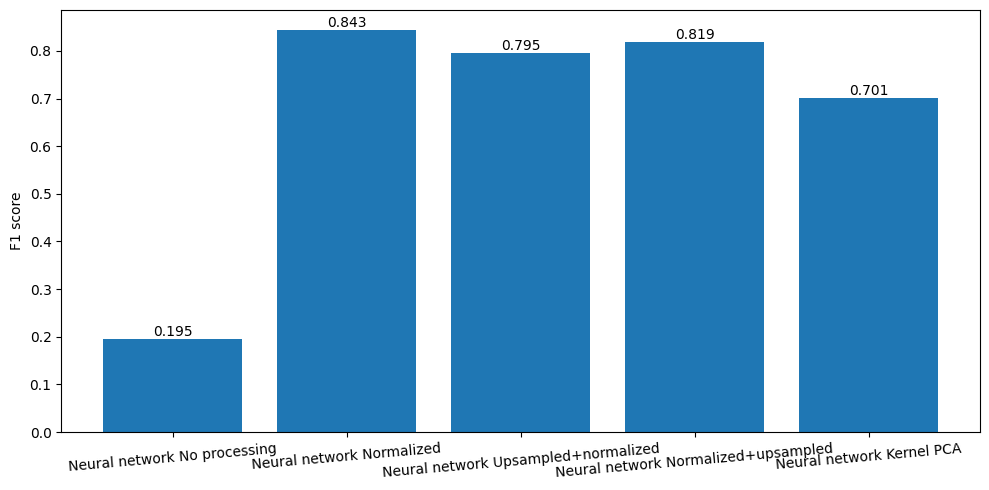

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.ylabel("F1 score")
plt.tight_layout()
plt.show()

### Iterations

Having picked our layer sizes, the adam solver, the tanh activation function, a constant learning rate, and the normalized dataset to train on, we check to see after how many iterations our model seems to stop improving. Although both more and less number of iterations were tested with, it seems this model plateaus at 200 iterations.  

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(iters):
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5),
                        activation="tanh",
                        max_iter=iters,
                        warm_start=True)
    mlp.fit(norm_X_train, y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "Neural network Iterations: " + str(iters),
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

archs = [
    100,
    200,
    300,
]

sl_tech_list += [nn_make(iters) for iters in archs]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


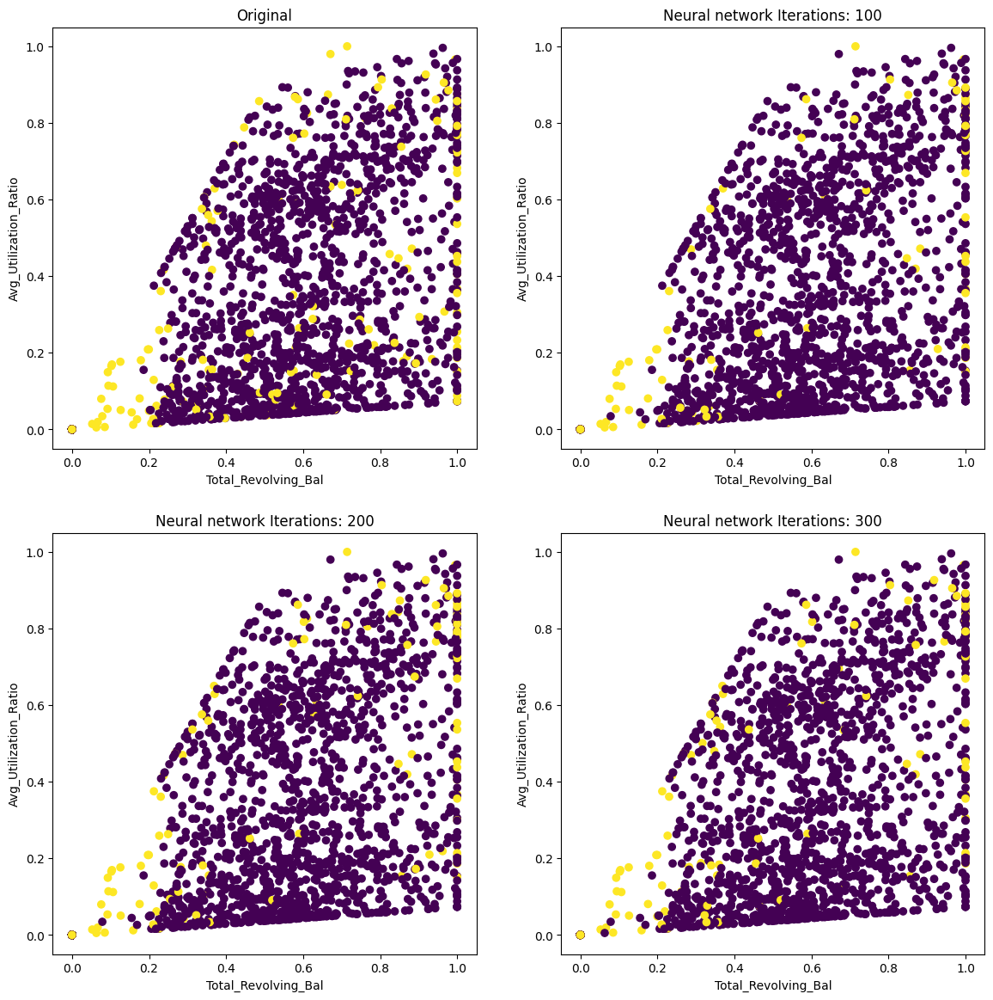

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(2,2,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(2,2,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1


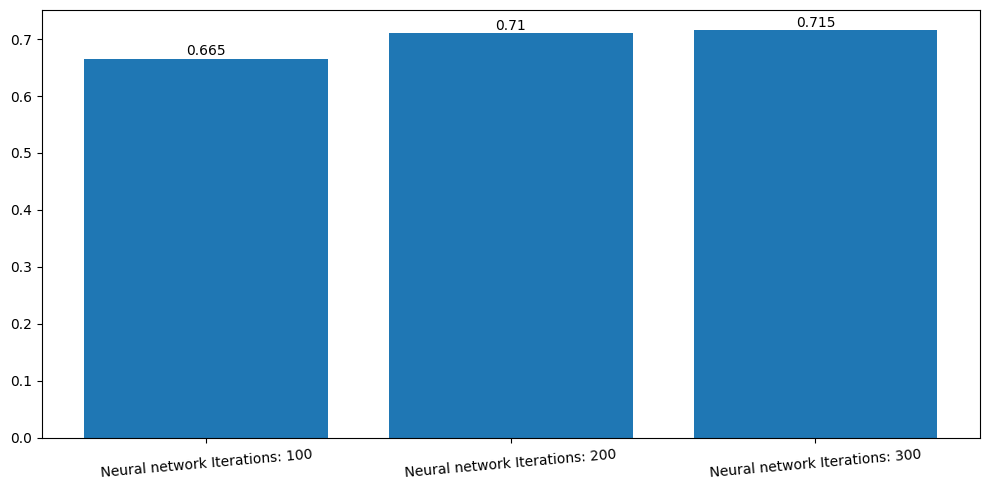

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

### Final Neural Network Model

Having chosen all these parameters, we still run the model several more times to account for lucky initializations and pick the best performing one.

In [ ]:
from sklearn.neural_network import MLPClassifier

sl_tech_list = []

def nn_make(attempt):
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5),
                        activation="tanh")
    mlp.fit(norm_X_train, y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "NN Adam #" + str(attempt),
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

def nn_make_2(attempt):
    mlp = MLPClassifier(hidden_layer_sizes=(25, 25, 25, 15, 15, 15, 5, 5, 5))
    mlp.fit(norm_X_train, y_train)
    preds = mlp.predict(norm_X_test)
    return {
        "name": "NN SGD #" + str(attempt),
        "X": norm_X_test,
        "y": y_test,
        "yhat": preds,
    }

sl_tech_list += [nn_make(n+1) for n in range(4)] + [nn_make_2(n+1) for n in range(4)]

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


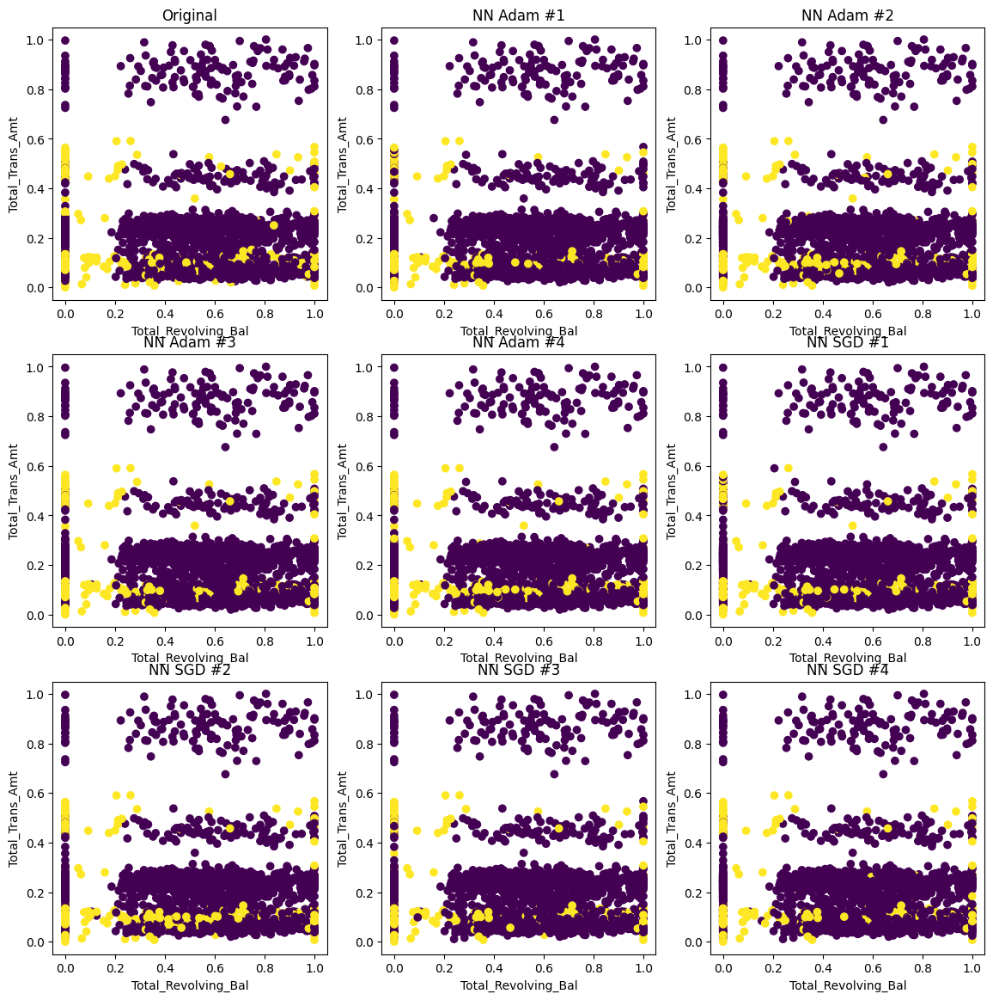

In [ ]:
plt.figure(figsize=(14,14))
plt.subplot(3,3,1)
plt.xlabel(norm_X_test.columns[3])
plt.ylabel(norm_X_test.columns[6])
plt.title("Original")
plt.scatter(norm_X_test.iloc[:,3], norm_X_test.iloc[:,6], c=y_test)
count = 2

for tech in sl_tech_list:
    plt.subplot(3,3,count)
    plt.title(tech["name"])
    plt.xlabel(tech["X"].columns[3])
    plt.ylabel(tech["X"].columns[6])
    plt.scatter(tech["X"].iloc[:,3], tech["X"].iloc[:,6], c=tech["yhat"])
    count += 1


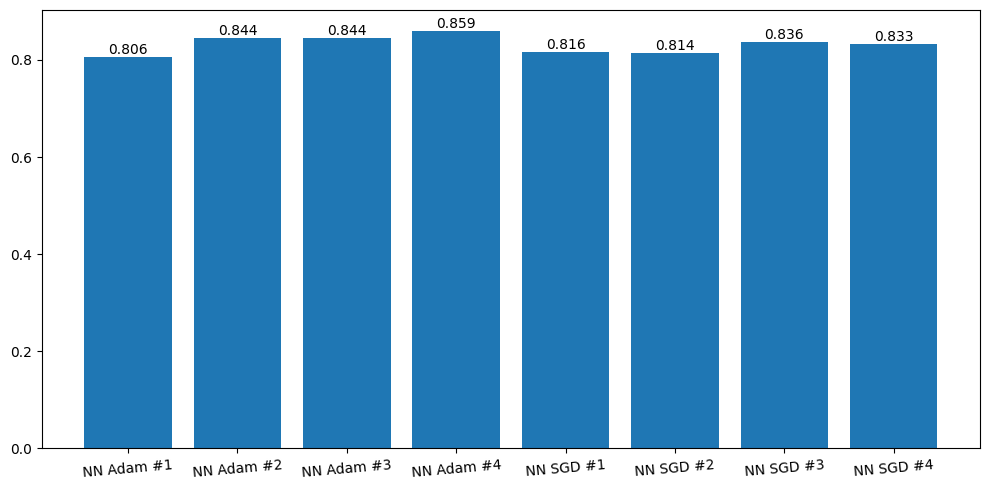

In [ ]:
from sklearn.metrics import f1_score

x = []
y = []
for tech in sl_tech_list:
    x += [tech["name"]]
    y += [f1_score(tech["y"], tech["yhat"])]

plt.figure(figsize=(10,5))
plt.xticks(rotation=5)
for i in range(len(x)):
    plt.text(i, y[i] + 0.006, str(y[i])[:5], ha="center")
plt.bar(x, y, label=y)
plt.tight_layout()
plt.show()

We pick the best one among the 5 and take a closer look at how well it actually performs.

From the below report, it's evident that neural networks are able to achieve a decent F1 score of 0.92; as with other models, it is worse with churning customers than remaining customers. The model is also more hesitant to mark a customer as churning because its recall on churning customers is fairly low at 0.69. There is still potential in finding a better model with neural networks, but as it stands currently, other models would still fare better.

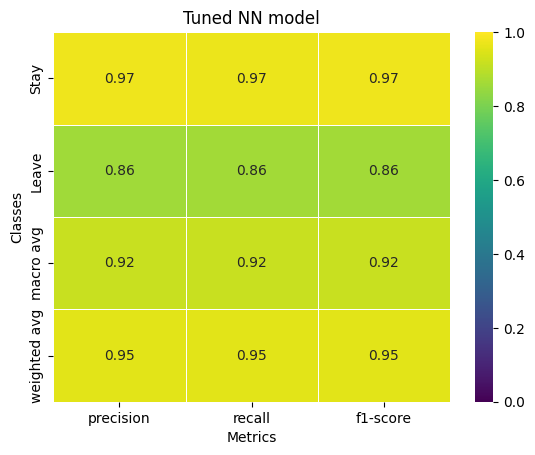

In [ ]:
from sklearn.metrics import classification_report

max_tech = sl_tech_list[np.argmax(y)]
report = classification_report(max_tech["y"], max_tech["yhat"], target_names=["Stay", "Leave"], output_dict=True)
# print(report(max_tech["y"], max_tech["yhat"], target_names=["Stay", "Leave"]))
ax = plt.subplot()
plot_classification_report(report, ax, "Tuned NN model")

## Random Forest

Random forest model run over four dataset versions (not normalized or upsampled, upsampled but not normalized, upsampled then normalized, normalized then upsampled). Key performance metric observed was weighted average F1 score before and after hyperparameter tuning.

In [ ]:
# Random forest

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import balanced_accuracy_score
import numpy as np
import matplotlib.pyplot as plt

# baseline random forest classifer performance
rf1 = RandomForestClassifier()
rf2 = RandomForestClassifier()
rf3 = RandomForestClassifier()
rf4 = RandomForestClassifier()


Random Forest Weighted Avg F1-Score for Different Dataset Versions Before Tuning
+------------------------------+-------------+----------+------------+---------------------+
|                              |   Precision |   Recall |   F1-Score |   Balanced Accuracy |
+==============================+=============+==========+============+=====================+
| Not upsampled or normalized  |    0.955091 | 0.956071 |   0.955053 |            0.897253 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled but not normalized |    0.958062 | 0.956565 |   0.95713  |            0.933355 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled then normalized    |    0.948091 | 0.94768  |   0.947872 |            0.907067 |
+------------------------------+-------------+----------+------------+---------------------+
| Normalized then upsampled    |    0.950522 | 0.950642 |   0.95058  |            

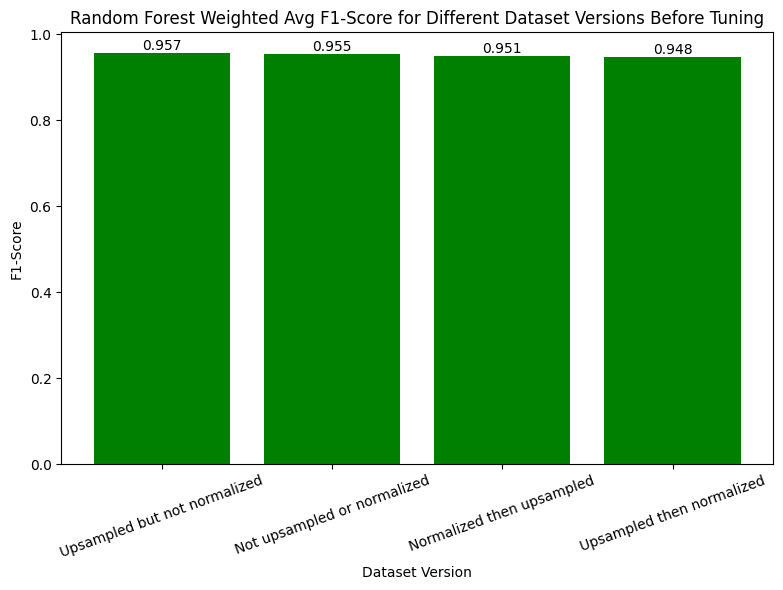

In [ ]:
from tabulate import tabulate

def rf_fit_compare_models(models, title_string, compare=False):

  rf1, rf2, rf3, rf4 = models[0], models[1], models[2], models[3]
  rf1.fit(X_train, y_train)
  rf2.fit(smote_X_train, smote_y_train)
  rf3.fit(smote_norm_X_train, smote_y_train)
  rf4.fit(norm_smote_X_train, norm_smote_y_train)

  report1 = classification_report(y_test, rf1.predict(X_test), output_dict=True)
  report2 = classification_report(y_test, rf2.predict(X_test), output_dict=True)
  report3 = classification_report(y_test, rf3.predict(norm_X_test), output_dict=True)
  report4 = classification_report(y_test, rf4.predict(norm_X_test), output_dict=True)

  columns = ["Precision", "Recall", "F1-Score", "Balanced Accuracy"]
  index = [
      "Not upsampled or normalized",
      "Upsampled but not normalized",
      "Upsampled then normalized",
      "Normalized then upsampled"
  ]

  data = [
      [report1['weighted avg']['precision'], report1['weighted avg']['recall'], report1['weighted avg']['f1-score'], balanced_accuracy_score(y_test, rf1.predict(X_test))],
      [report2['weighted avg']['precision'], report2['weighted avg']['recall'], report2['weighted avg']['f1-score'], balanced_accuracy_score(y_test, rf2.predict(X_test))],
      [report3['weighted avg']['precision'], report3['weighted avg']['recall'], report3['weighted avg']['f1-score'], balanced_accuracy_score(y_test, rf3.predict(norm_X_test))],
      [report4['weighted avg']['precision'], report4['weighted avg']['recall'], report4['weighted avg']['f1-score'], balanced_accuracy_score(y_test, rf4.predict(norm_X_test))]
  ]

  # compare classification reports
  comparison_table = pd.DataFrame(data, columns=columns, index=index)

  print(title_string)
  print(tabulate(comparison_table, headers='keys', tablefmt='grid', showindex=True))

  f1_scores = [
      report1['weighted avg']['f1-score'],
      report2['weighted avg']['f1-score'],
      report3['weighted avg']['f1-score'],
      report4['weighted avg']['f1-score']
  ]

  data_sorted = sorted(zip(index, f1_scores), key=lambda x: x[1], reverse=True)
  sorted_versions, sorted_f1_scores = zip(*data_sorted)

  if compare==False:

    # plot the F1-scores of the dataset only when compare mode is off
    plt.figure(figsize=(8, 6))
    plt.bar(sorted_versions, sorted_f1_scores, color='green')
    plt.xlabel('Dataset Version')
    plt.ylabel('F1-Score')
    plt.title(title_string)
    plt.xticks(rotation=20)

    for version, f1 in zip(sorted_versions, sorted_f1_scores):
        plt.text(version, f1, f"{f1:.3f}", ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

  return f1_scores

rf_models = [rf1, rf2, rf3, rf4]
orig_f1_scores = rf_fit_compare_models(rf_models, 'Random Forest Weighted Avg F1-Score for Different Dataset Versions Before Tuning')

As observed from the baseline random forest classification reports above (prior to hyperparameter tuning), all the datasets all have very high and relatively close metrics, with the not upsampled nor normalized dataset outperforming the rest in terms of F1 score by a very small margin.

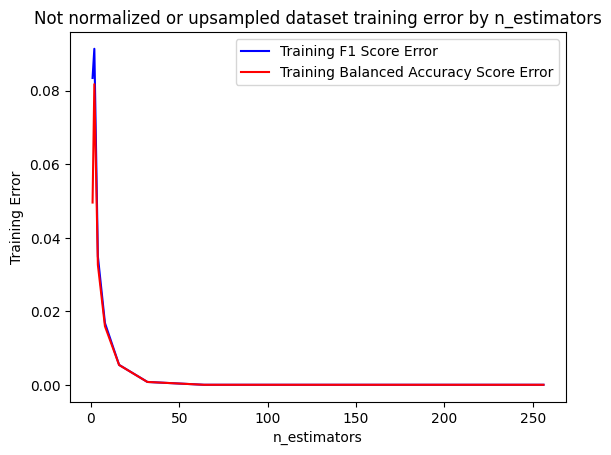

In [ ]:
n_estimators = [1, 2, 4, 8, 16, 32, 64, 128, 256]
train_error_f1 = []
train_error_accuracy = []

for estimator in n_estimators:
    rf = RandomForestClassifier(n_estimators=estimator, n_jobs=-1)
    rf.fit(X_train, y_train)
    train_pred = rf.predict(X_train)
    train_f1 = f1_score(y_train, train_pred)
    train_accuracy = balanced_accuracy_score(y_train, train_pred)
    train_error_f1.append(1 - train_f1)
    train_error_accuracy.append(1 - train_accuracy)

plt.plot(n_estimators, train_error_f1, 'b', label="Training F1 Score Error")
plt.plot(n_estimators, train_error_accuracy, 'r', label="Training Balanced Accuracy Score Error")
plt.legend()
plt.ylabel('Training Error')
plt.xlabel('n_estimators')
plt.title('Not normalized or upsampled dataset training error by n_estimators')
plt.show()

After plotting all of the dataset version n_estimators by training error plots, all of them stabalized at around 100 and had essentially identical curves. Therefore, only the first version was kept. N-estimators is set around 100.

In [ ]:
# hyperparameter cross validation tuning with k-folds = 5
# note: do not run cell again - it takes a long time

# test n_estimators around 100
param_grid = {
    'n_estimators': [75, 100, 125],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [3, 5, 10, None]
}

grid_search = GridSearchCV(rf1, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(X_train, y_train)
print("baseline dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(rf2, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(smote_X_train, smote_y_train)
print("upsampled dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(rf3, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(smote_norm_X_train, smote_y_train)
print("upsampled then normalized dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(rf4, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(norm_smote_X_train, norm_smote_y_train)
print("normalized then upsampled dataset:", grid_search.best_estimator_)

baseline dataset: RandomForestClassifier(n_estimators=125)
upsampled dataset: RandomForestClassifier(max_features='log2')
upsampled then normalized dataset: RandomForestClassifier(n_estimators=125)
normalized then upsampled dataset: RandomForestClassifier(n_estimators=125)


Based on the grid search results, I decided to discard the n_estimators suggestions to decrease to 75 from a default of 100 where that was the sole change because after testing because they consistently resulted in reduced model weighted average F-1 score.

Random Forest Weighted Avg F1-Score for Different Dataset Versions After Tuning
+------------------------------+-------------+----------+------------+---------------------+
|                              |   Precision |   Recall |   F1-Score |   Balanced Accuracy |
+==============================+=============+==========+============+=====================+
| Not upsampled or normalized  |    0.958757 | 0.959526 |   0.958897 |            0.910426 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled but not normalized |    0.95532  | 0.95311  |   0.953903 |            0.931295 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled then normalized    |    0.949929 | 0.949161 |   0.949499 |            0.912889 |
+------------------------------+-------------+----------+------------+---------------------+
| Normalized then upsampled    |    0.950051 | 0.949654 |   0.949839 |            0

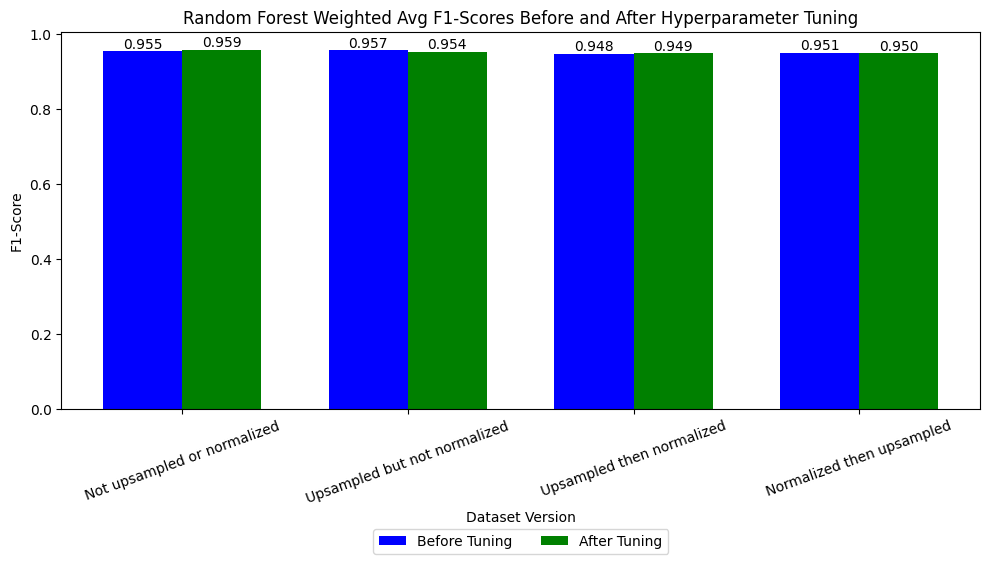

In [ ]:
rf1_updated = RandomForestClassifier(n_estimators=125)
rf2_updated = RandomForestClassifier(max_features='log2')
rf3_updated = RandomForestClassifier(n_estimators=125)
rf4_updated = RandomForestClassifier(n_estimators=125)

rf_models_updated = [rf1_updated, rf2_updated, rf3_updated, rf4_updated]

updated_f1_scores = rf_fit_compare_models(rf_models_updated, "Random Forest Weighted Avg F1-Score for Different Dataset Versions After Tuning", compare=True)
bar_width = 0.35

x = np.arange(4)

# create the double bar graph comparing before / after tuning

index = [
    "Not upsampled or normalized",
    "Upsampled but not normalized",
    "Upsampled then normalized",
    "Normalized then upsampled"
]

plt.figure(figsize=(10, 6))
bar1 = plt.bar(x, orig_f1_scores, width=bar_width, label='Before Tuning', color='b')
bar2 = plt.bar(x + bar_width, updated_f1_scores, width=bar_width, label='After Tuning', color='g')

plt.xlabel('Dataset Version')
plt.ylabel('F1-Score')
plt.title('Random Forest Weighted Avg F1-Scores Before and After Hyperparameter Tuning')
plt.xticks(x + bar_width/2, index, rotation=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), fancybox=True, ncol=2)

for i in range(len(index)):
    plt.text(x[i], orig_f1_scores[i], f"{orig_f1_scores[i]:.3f}", ha='center', va='bottom')
    plt.text(x[i] + bar_width, updated_f1_scores[i], f"{updated_f1_scores[i]:.3f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

After hyperparameter tuning, it appears that there is little to no difference between performance (especially in F-1) between the original and hyperparameter tuned models. The best performing dataset (not upsampled or normalized) is the only one that consistently always increases after tuning in performance across all metrics after tuning. The other datasets are not significantly different before/after tuning and vary from trial to trial. The balanced accuracy also increased slightly for all dataset versions after tuning, and other metrics (precision, recall) appeared vary slightly, but largely remain constant after tuning.

Surprisingly, consistently the best performing dataset in terms of weighted average F-1 score was the "Not upsampled nor normalized dataset," which is quite interesting since decision trees are impacted by class imbalance and the data in that dataset was not upsampled. Since normalization and scale does not impact random forest or decision trees, the consistent outperformance of "Not upsampled nor normalized dataset" compared to the normalized datasets before and after tuning may be due to other reasons.

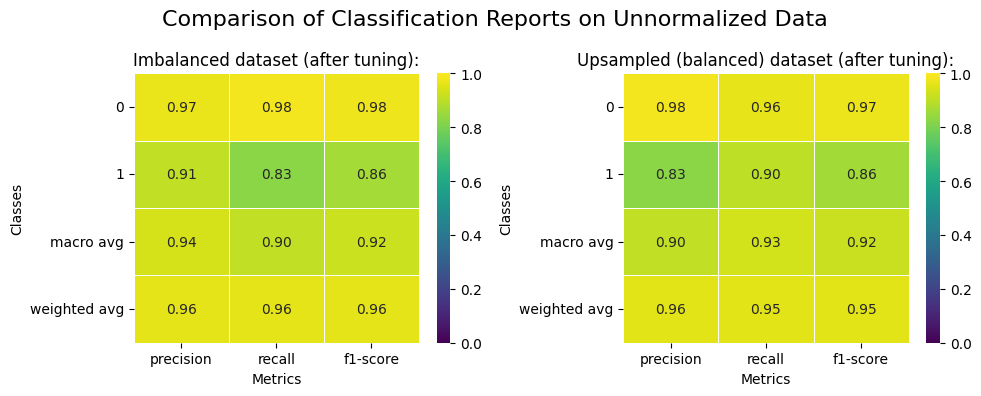

{'0': {'precision': 0.9670138888888888,
  'recall': 0.9835197174808711,
  'f1-score': 0.9751969652757514,
  'support': 1699},
 '1': {'precision': 0.9060402684563759,
  'recall': 0.8256880733944955,
  'f1-score': 0.8640000000000001,
  'support': 327},
 'accuracy': 0.9580454096742349,
 'macro avg': {'precision': 0.9365270786726323,
  'recall': 0.9046038954376833,
  'f1-score': 0.9195984826378758,
  'support': 2026},
 'weighted avg': {'precision': 0.957172638207037,
  'recall': 0.9580454096742349,
  'f1-score': 0.9572495774943246,
  'support': 2026}}

In [ ]:
# print classification report of best performing random forest models
report1 = classification_report(y_test, rf1_updated.predict(X_test), output_dict=True)
report2 = classification_report(y_test, rf2_updated.predict(X_test), output_dict=True)

def plot_classification_report(report, ax, title):
    report_df = pd.DataFrame.from_dict(report).transpose()
    report_df = report_df.drop("support", axis=1)
    report_df = report_df.drop("accuracy", axis=0)

    sns.heatmap(report_df, annot=True, cmap="viridis", fmt=".2f", linewidths=0.5, vmin=0, vmax=1, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# Plot the first heatmap on the first subplot with a custom title
plot_classification_report(report1, ax1, "Imbalanced dataset (after tuning):")

# Plot the second heatmap on the second subplot with a custom title
plot_classification_report(report2, ax2, "Upsampled (balanced) dataset (after tuning):")

# Set a common title for both subplots
fig.suptitle('Random Forest Comparison of Classification Reports on Unnormalized Data', fontsize=16)

plt.tight_layout()
plt.show()
report1

Comparing the non normalized datasets, the upsampled version tends to capture recall of the minority class (+0.05) better at the expense of loss of precision (-0.08), which makes sense because decision trees are impacted by class imbalance and by upsampling the minority class, the the trees in the random forest model were able to sample and learn more points of the minority class. However, overall the not normalized and not upsampled data still outperformed the upsampled dataset in precision for the minority class by a larger margin  and therefore has a greater f-1 score across both classes, which is our chosen key metric.

Overall: the random forest classifier performs the best on the not normalized and not upsampled raw feature selected dataset (random forest model variable in code: rf1_updated). We chose the not normalized and not upsampled dataset's model because of it's high weighted F1 score. F1-score summary:

*   Existing customer: 0.98
*   Attrited customer: 0.88
*   Macro average: 0.93
*   Weighted average: 0.96

Overall, a weighted average F1 score of 0.96 is very good. Balanced accuracy is 91.5%.

## Kernel Soft SVM

In [ ]:
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [ ]:
param_grid = {'C': [ 0.1, 4, 10, 100],
              'gamma': ['scale', 'auto'],
              'kernel': ['rbf']}

# fitting the model for grid search (normalized then SMOTE)
grid = GridSearchCV(svm.SVC(), param_grid, refit = True)
grid.fit(norm_smote_X_train, norm_smote_y_train)
grid_predictions_norm_smote = grid.predict(norm_X_test)
print(grid.best_params_)

# fitting the model for grid search (normalized with no SMOTE)
grid = GridSearchCV(svm.SVC(), param_grid, refit = True)
grid.fit(norm_X_train, y_train)
grid_predictions_norm = grid.predict(norm_X_test)
print(grid.best_params_)

# fitting the model for grid search (SMOTE unnormalized data)
grid = GridSearchCV(svm.SVC(), param_grid, refit = True)
grid.fit(smote_X_train, smote_y_train)
grid_predictions_smote = grid.predict(X_test)
print(grid.best_params_)

# fitting the model for grid search (not SMOTE and unnormalized)
grid = GridSearchCV(svm.SVC(), param_grid, refit = True, )
grid.fit(X_train, y_train)
grid_predictions = grid.predict(X_test)
print(grid.best_params_)

{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}


{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}


Text(0.5, 0.98, 'Kernel Soft SVM')

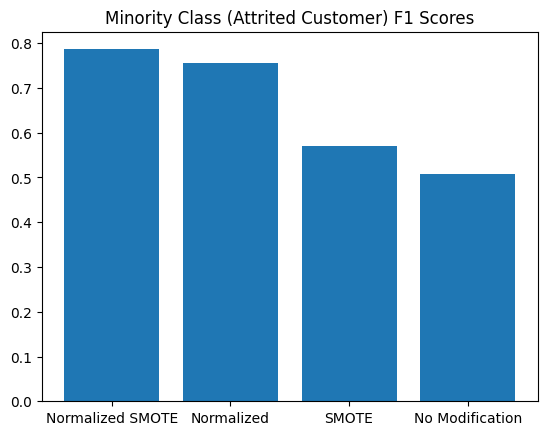

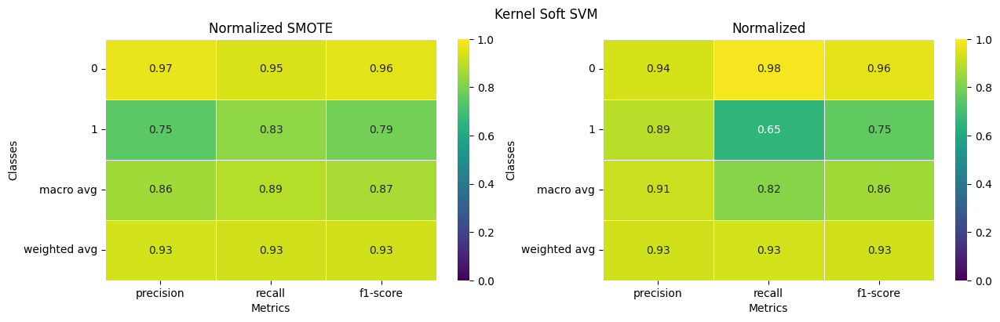

In [ ]:
from sklearn.metrics import davies_bouldin_score, silhouette_score, recall_score, precision_score, f1_score, classification_report

def plot_classification_report(report, ax, title):
    report_df = pd.DataFrame.from_dict(report).transpose()
    report_df = report_df.drop("support", axis=1)
    report_df = report_df.drop("accuracy", axis=0)

    sns.heatmap(report_df, annot=True, cmap="viridis", fmt=".2f", linewidths=0.5, vmin=0, vmax=1, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')

f1_type = ['Normalized SMOTE', 'Normalized', 'SMOTE', 'No Modification']
f1_score_results = [f1_score(grid_predictions_norm_smote, y_test),
                    f1_score(grid_predictions_norm, y_test),
                    f1_score(grid_predictions_smote, y_test),
                    f1_score(grid_predictions, y_test)]

plt.title("Minority Class (Attrited Customer) F1 Scores")
plt.bar(f1_type, f1_score_results)
# print best parameter after tuning
print(grid.best_params_)

# clf = svm.SVC(kernel='rbf', C=4)
# clf.fit(norm_smote_X_train, norm_smote_y_train)
# predict = clf.predict(norm_X_test)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))

plot_classification_report(classification_report(y_test, grid_predictions_norm_smote, output_dict=True), ax1, f1_type[0])
plot_classification_report(classification_report(y_test, grid_predictions_norm, output_dict=True), ax2, f1_type[1])
plt.suptitle("Kernel Soft SVM")
# plot_classification_report(classification_report(y_test, grid_predictions_smote, output_dict=True), ax3, f1_type[2])
# plot_classification_report(classification_report(y_test, grid_predictions, output_dict=True), ax4, f1_type[3])

## Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

We want to get more easily interpretable results than those produced by the more opaque Neural Network and Random Forest. Therefore, we performed hyperparameter tuning on the post-pruning parameter, $\alpha$, and found that `ccp_alpha=0.0005065963391630152` produces the highest F1 and accuracy.

In [ ]:
def plot_classification_report(report, ax, title):
    report_df = pd.DataFrame.from_dict(report).transpose()
    report_df = report_df.drop("support", axis=1)
    report_df = report_df.drop("accuracy", axis=0)

    sns.heatmap(report_df, annot=True, cmap="viridis", fmt=".2f", linewidths=0.5, vmin=0, vmax=1, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')

In [ ]:
clf = DecisionTreeClassifier(random_state=0)
# clf = DecisionTreeClassifier(random_state=0,
#                              criterion='entropy',
#                              min_samples_split=2,
#                              min_samples_leaf=6)
# clf = DecisionTreeClassifier(random_state=0,
#                              criterion="gini",
#                              max_features=None,
#                              min_samples_leaf=1,
#                              min_samples_split=22)
path = clf.cost_complexity_pruning_path(rf_X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
# ccp_alphas = np.logspace(-5,-2, num=20)
ccp_alphas = ccp_alphas[:-2]
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(rf_X_train, y_train)
    clfs.append(clf)

train_scores = []
test_scores  = []
train_f1s    = []
test_f1s     = []

for clf in clfs:
    train_scores.append(clf.score(rf_X_train, y_train))
    test_scores.append(clf.score(rf_X_test, y_test))
    train_f1s.append(f1_score(clf.predict(rf_X_train), y_train))
    test_f1s.append(f1_score(clf.predict(rf_X_test), y_test))

alpha= 0.000741964697031972 f1= 0.8359621451104102 accuracy= 0.9486673247778875
alpha= 0.000741964697031972 f1= 0.8359621451104102 accuracy= 0.9486673247778875


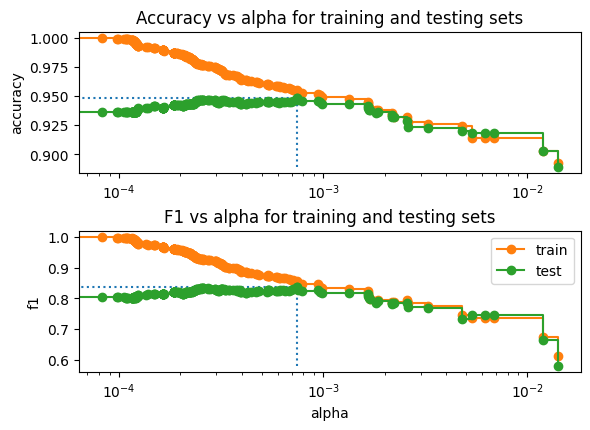

In [ ]:
best_f1 = max(enumerate(test_f1s), key=lambda x:x[1])
best_score = max(enumerate(test_scores), key=lambda x:x[1])
min_score = min(test_scores)
min_f1 = min(test_f1s)

print("alpha=",ccp_alphas[best_f1[0]], "f1=", test_f1s[best_f1[0]], "accuracy=",test_scores[best_f1[0]])
print("alpha=",ccp_alphas[best_score[0]], "f1=", test_f1s[best_score[0]], "accuracy=",test_scores[best_score[0]])

ax = plt.subplot(2,1,1)
# ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot([ccp_alphas[best_score[0]], ccp_alphas[best_score[0]], 0], [min_score, best_score[1], best_score[1]], ":")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.set_xscale("log")

ax = plt.subplot(2,1,2)
ax.set_xlabel("alpha")
ax.set_ylabel("f1")
ax.set_title("F1 vs alpha for training and testing sets")
ax.plot([ccp_alphas[best_f1[0]], ccp_alphas[best_f1[0]], 0], [min_f1, best_f1[1], best_f1[1]], ":")
ax.plot(ccp_alphas, train_f1s, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_f1s, marker="o", label="test", drawstyle="steps-post")
ax.set_xscale("log")

plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)
plt.legend(loc="upper right")
plt.show()

In [ ]:
# parameters = {
#               'criterion': ("gini", "entropy", "log_loss"),
#               'min_samples_split': list(range(2,33,5)),
#               'min_samples_leaf': list(range(1,33,5)),
#               "ccp_alpha": np.logspace(-5,-2, num=20)
#               }

# gs = GridSearchCV(DecisionTreeClassifier(), parameters, scoring="f1", refit=True)
# gs.fit(rf_X_train, y_train)

In [ ]:
# gs_predictions = gs.predict(rf_X_test)
# print(gs.best_params_)
# report = classification_report(y_test, gs_predictions, output_dict=True)
# ax = plt.subplot()
# plot_classification_report(report, ax, "Best")
## {'ccp_alpha': 0.0011288378916846883, 'criterion': 'log_loss', 'min_samples_leaf': 1, 'min_samples_split': 7}

{'0': {'precision': 0.9639325189063409, 'recall': 0.9752795762213067, 'f1-score': 0.9695728496196607, 'support': 1699}, '1': {'precision': 0.8631921824104235, 'recall': 0.8103975535168195, 'f1-score': 0.8359621451104102, 'support': 327}, 'accuracy': 0.9486673247778875, 'macro avg': {'precision': 0.9135623506583822, 'recall': 0.8928385648690631, 'f1-score': 0.9027674973650355, 'support': 2026}, 'weighted avg': {'precision': 0.9476728495903661, 'recall': 0.9486673247778875, 'f1-score': 0.9480078444989674, 'support': 2026}}


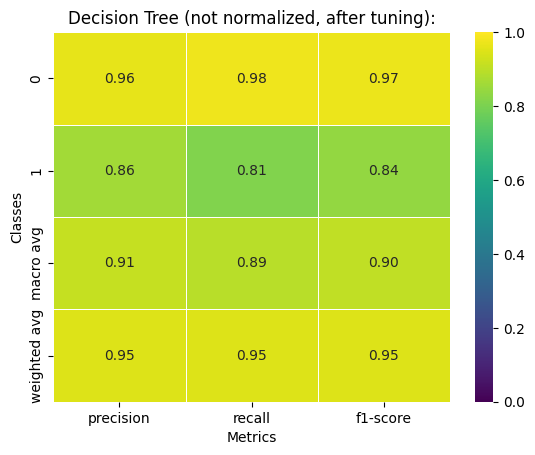

In [ ]:
dtc = DecisionTreeClassifier(random_state=0, ccp_alpha=0.000741964697031972) # trained best f1 and accuracy pruning

dtc.fit(rf_X_train, y_train)
dtc_predictions = dtc.predict(rf_X_test)

dtc_report = classification_report(y_test, dtc_predictions, output_dict=True)
print(dtc_report)
ax = plt.subplot()
plot_classification_report(dtc_report, ax, "Decision Tree (not normalized, after tuning):")
plt.show()

These results are comparable to (but marginally worse than) the Random Forest classifier. However, the simpler nature of this model makes its internal workings much more clearly interpretable. Below is a cut-off view of the actual decision tree, and you can clearly see what the model is using to decide on classifications.

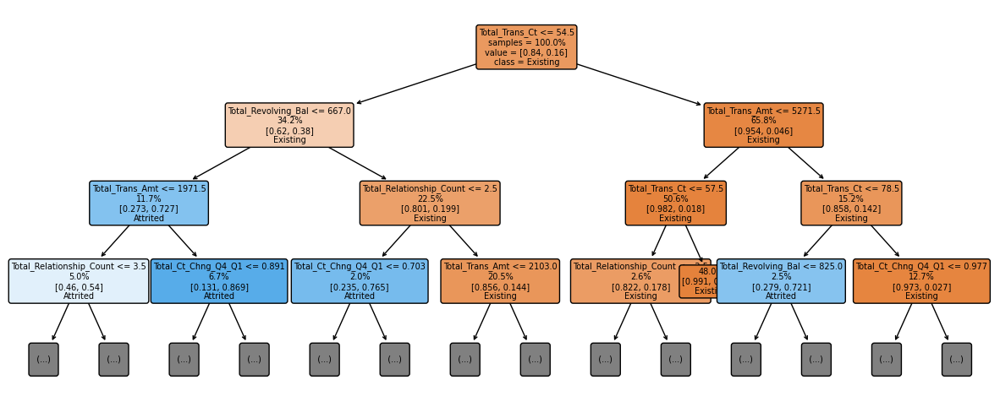

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(15,6))
ax = plt.subplot()
plot_tree(dtc, ax=ax, max_depth=3,
          feature_names=X_train.columns,
          class_names=["Existing", "Attrited"],
          filled=True, rounded=True, impurity=False,
          proportion=True, label="root", fontsize=7)
pass

Reading off the tree, we can directly see why the model classified a particular account as likely to be attrited, in a human-readable manner.

This ease of interpretability makes auditing the model easier, something that may be desirable to a financial institution.

## Decision Tree, Forest + PCA

Introducing PCA makes the model perform significantly worse. This appears to be because the recall for our less common target, "Attrited", goes down significantly for these models, which means the PCA is obscuring attrited customers.

Random Forest + PCA
               precision    recall  f1-score   support

           0    0.92952   0.98587   0.95687      1699
           1    0.89286   0.61162   0.72595       327

    accuracy                        0.92547      2026
   macro avg    0.91119   0.79875   0.84141      2026
weighted avg    0.92360   0.92547   0.91960      2026

Decision Tree + PCA
               precision    recall  f1-score   support

           0    0.92399   0.96586   0.94446      1699
           1    0.76800   0.58716   0.66551       327

    accuracy                        0.90474      2026
   macro avg    0.84599   0.77651   0.80499      2026
weighted avg    0.89881   0.90474   0.89944      2026



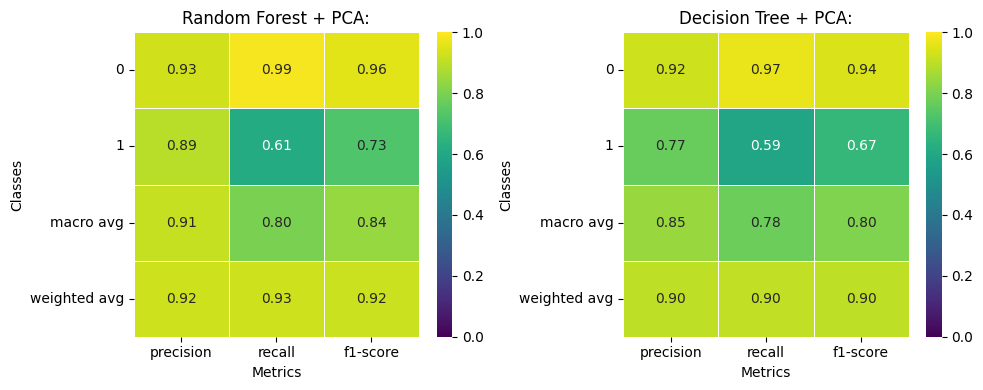

In [ ]:
rfc_pca = RandomForestClassifier(max_features='log2')
rfc_pca.fit(X_pca, y_train)

rfc_pca_predictions = rfc_pca.predict(X_pca_test)

dtc_pca = DecisionTreeClassifier(random_state=0, ccp_alpha=0.00024582614898741733)
dtc_pca.fit(X_pca, y_train)
dtc_pca_predictions = dtc_pca.predict(X_pca_test)

print("Random Forest + PCA\n", classification_report(y_test, rfc_pca_predictions, digits=5))
print("Decision Tree + PCA\n", classification_report(y_test, dtc_pca_predictions, digits=5))

rfc_pca_report =  classification_report(y_test, rfc_pca_predictions, output_dict=True)
dtc_pca_report = classification_report(y_test, dtc_pca_predictions, output_dict=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

plot_classification_report(rfc_pca_report, ax1, "Random Forest + PCA:")
plot_classification_report(dtc_pca_report, ax2, "Decision Tree + PCA:")
plt.tight_layout()
plt.show()

## Gradient-Boosted Tree

In [ ]:
# Gradient-Boosted Tree

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import balanced_accuracy_score
#from sklearn.metrics import acc
import numpy as np
import matplotlib.pyplot as plt

# baseline gradient-boosting classifer performance
gb1 = GradientBoostingClassifier()
gb2 = GradientBoostingClassifier()
gb3 = GradientBoostingClassifier()
gb4 = GradientBoostingClassifier()

GB Tree Weighted Avg F1-Score for Different Dataset Versions Before Tuning
+------------------------------+-------------+----------+------------+---------------------+
|                              |   Precision |   Recall |   F1-Score |   Balanced Accuracy |
+==============================+=============+==========+============+=====================+
| Not upsampled or normalized  |    0.960779 | 0.9615   |   0.96085  |            0.912838 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled but not normalized |    0.957404 | 0.95311  |   0.954401 |            0.943643 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled then normalized    |    0.95342  | 0.949161 |   0.950509 |            0.935115 |
+------------------------------+-------------+----------+------------+---------------------+
| Normalized then upsampled    |    0.95231  | 0.949161 |   0.950242 |            0.9289

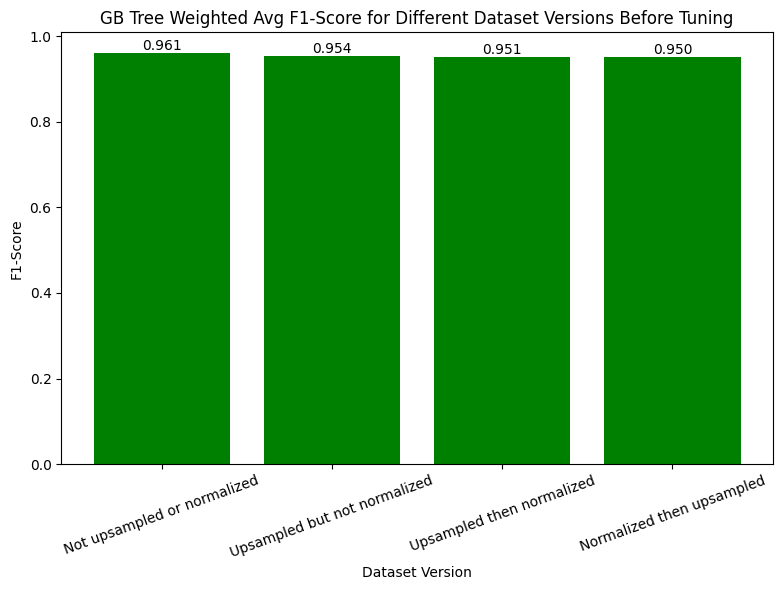

In [ ]:
from tabulate import tabulate
def gb_fit_compare_models(models, title_string, compare=False):

  gb1, gb2, gb3, gb4 = models[0], models[1], models[2], models[3]
  gb1.fit(X_train, y_train)
  gb2.fit(smote_X_train, smote_y_train)
  gb3.fit(smote_norm_X_train, smote_y_train)
  gb4.fit(norm_smote_X_train, norm_smote_y_train)

  report1 = classification_report(y_test, gb1.predict(X_test), output_dict=True)
  report2 = classification_report(y_test, gb2.predict(X_test), output_dict=True)
  report3 = classification_report(y_test, gb3.predict(norm_X_test), output_dict=True)
  report4 = classification_report(y_test, gb4.predict(norm_X_test), output_dict=True)

  columns = ["Precision", "Recall", "F1-Score", "Balanced Accuracy"]
  index = [
      "Not upsampled or normalized",
      "Upsampled but not normalized",
      "Upsampled then normalized",
      "Normalized then upsampled"
  ]

  data = [
      [report1['weighted avg']['precision'], report1['weighted avg']['recall'], report1['weighted avg']['f1-score'], balanced_accuracy_score(y_test, gb1.predict(X_test))],
      [report2['weighted avg']['precision'], report2['weighted avg']['recall'], report2['weighted avg']['f1-score'], balanced_accuracy_score(y_test, gb2.predict(X_test))],
      [report3['weighted avg']['precision'], report3['weighted avg']['recall'], report3['weighted avg']['f1-score'], balanced_accuracy_score(y_test, gb3.predict(norm_X_test))],
      [report4['weighted avg']['precision'], report4['weighted avg']['recall'], report4['weighted avg']['f1-score'], balanced_accuracy_score(y_test, gb4.predict(norm_X_test))]
  ]

  # compare classification reports
  comparison_table = pd.DataFrame(data, columns=columns, index=index)

  print(title_string)
  print(tabulate(comparison_table, headers='keys', tablefmt='grid', showindex=True))

  f1_scores = [
      report1['weighted avg']['f1-score'],
      report2['weighted avg']['f1-score'],
      report3['weighted avg']['f1-score'],
      report4['weighted avg']['f1-score']
  ]

  data_sorted = sorted(zip(index, f1_scores), key=lambda x: x[1], reverse=True)
  sorted_versions, sorted_f1_scores = zip(*data_sorted)

  if compare==False:

    # plot the F1-scores of the dataset only when compare mode is off
    plt.figure(figsize=(8, 6))
    plt.bar(sorted_versions, sorted_f1_scores, color='green')
    plt.xlabel('Dataset Version')
    plt.ylabel('F1-Score')
    plt.title(title_string)
    plt.xticks(rotation=20)

    for version, f1 in zip(sorted_versions, sorted_f1_scores):
        plt.text(version, f1, f"{f1:.3f}", ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

  return f1_scores

gb_models = [gb1, gb2, gb3, gb4]
orig_f1_scores = gb_fit_compare_models(gb_models, 'GB Tree Weighted Avg F1-Score for Different Dataset Versions Before Tuning')

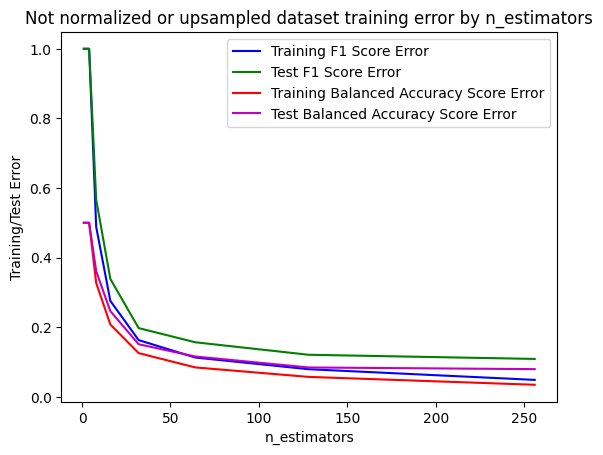

In [ ]:
n_estimators = [1, 2, 4, 8, 16, 32, 64, 128, 256]
train_error_f1 = []
test_error_f1 = []
train_error_accuracy = []
test_error_accuracy = []

for estimator in n_estimators:
    gb = GradientBoostingClassifier(n_estimators=estimator)
    gb.fit(X_train, y_train)
    train_pred = gb.predict(X_train)
    train_f1 = f1_score(y_train, train_pred)
    train_accuracy = balanced_accuracy_score(y_train, train_pred)
    test_pred = gb.predict(X_test)
    test_f1 = f1_score(y_test, test_pred)
    test_accuracy = balanced_accuracy_score(y_test, test_pred)
    test_error_f1.append(1 - test_f1)
    test_error_accuracy.append(1 - test_accuracy)
    train_error_f1.append(1 - train_f1)
    train_error_accuracy.append(1 - train_accuracy)

plt.plot(n_estimators, train_error_f1, 'b', label="Training F1 Score Error")
plt.plot(n_estimators, test_error_f1, 'g', label="Test F1 Score Error")
plt.plot(n_estimators, train_error_accuracy, 'r', label="Training Balanced Accuracy Score Error")
plt.plot(n_estimators, test_error_accuracy, 'm', label="Test Balanced Accuracy Score Error")
plt.legend()
plt.ylabel('Training/Test Error')
plt.xlabel('n_estimators')
plt.title('Not normalized or upsampled dataset training error by n_estimators')
plt.show()

In [ ]:
# hyperparameter cross validation tuning with k-folds = 5
# note: do not run cell again - it takes a long time

# test n_estimators around 125
param_grid = {
    'n_estimators': [100, 125, 150],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [3, 5, 10, None]
}

grid_search = GridSearchCV(gb1, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(X_train, y_train)
print("baseline dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(gb2, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(smote_X_train, smote_y_train)
print("upsampled dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(gb3, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(smote_norm_X_train, smote_y_train)
print("upsampled then normalized dataset:", grid_search.best_estimator_)

grid_search = GridSearchCV(gb4, scoring='f1', param_grid=param_grid, n_jobs=-1)
grid_search.fit(norm_smote_X_train, norm_smote_y_train)
print("normalized then upsampled dataset:", grid_search.best_estimator_)

baseline dataset: GradientBoostingClassifier(max_depth=5, max_features='log2', n_estimators=125)
upsampled dataset: GradientBoostingClassifier(max_depth=10, max_features='sqrt', n_estimators=150)
upsampled then normalized dataset: GradientBoostingClassifier(max_depth=10, max_features='log2', n_estimators=150)
normalized then upsampled dataset: GradientBoostingClassifier(max_depth=10, max_features='log2', n_estimators=125)


Gradient Boosted Classifier Weighted Avg F1-Score for Different Dataset Versions After Tuning
+------------------------------+-------------+----------+------------+---------------------+
|                              |   Precision |   Recall |   F1-Score |   Balanced Accuracy |
+==============================+=============+==========+============+=====================+
| Not upsampled or normalized  |    0.961297 | 0.961994 |   0.961378 |            0.914367 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled but not normalized |    0.955731 | 0.949654 |   0.951366 |            0.945287 |
+------------------------------+-------------+----------+------------+---------------------+
| Upsampled then normalized    |    0.954131 | 0.950148 |   0.951418 |            0.935703 |
+------------------------------+-------------+----------+------------+---------------------+
| Normalized then upsampled    |    0.953258 | 0.950148 |   0.951208 

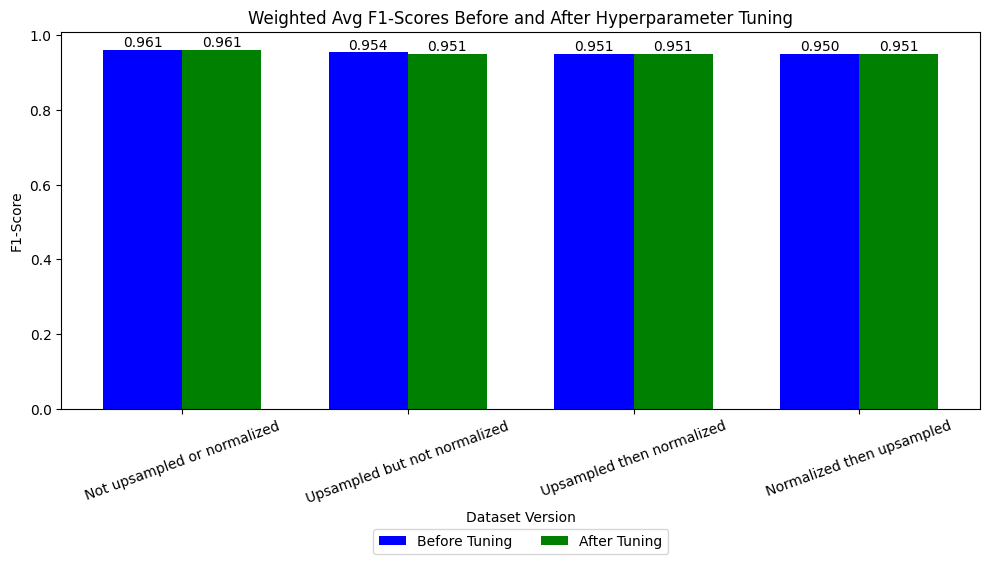

In [ ]:
gb1_updated = GradientBoostingClassifier(max_depth=5)
gb2_updated = GradientBoostingClassifier(max_features='sqrt')
gb3_updated = GradientBoostingClassifier(n_estimators=125)
gb4_updated = GradientBoostingClassifier(n_estimators=125)

gb_models_updated = [gb1_updated, gb2_updated, gb3_updated, gb4_updated]

updated_f1_scores = gb_fit_compare_models(gb_models_updated, "Gradient Boosted Classifier Weighted Avg F1-Score for Different Dataset Versions After Tuning", compare=True)
bar_width = 0.35

x = np.arange(4)

# create the double bar graph comparing before / after tuning

index = [
    "Not upsampled or normalized",
    "Upsampled but not normalized",
    "Upsampled then normalized",
    "Normalized then upsampled"
]

plt.figure(figsize=(10, 6))
bar1 = plt.bar(x, orig_f1_scores, width=bar_width, label='Before Tuning', color='b')
bar2 = plt.bar(x + bar_width, updated_f1_scores, width=bar_width, label='After Tuning', color='g')

plt.xlabel('Dataset Version')
plt.ylabel('F1-Score')
plt.title('Weighted Avg F1-Scores Before and After Hyperparameter Tuning')
plt.xticks(x + bar_width/2, index, rotation=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), fancybox=True, ncol=2)

for i in range(len(index)):
    plt.text(x[i], orig_f1_scores[i], f"{orig_f1_scores[i]:.3f}", ha='center', va='bottom')
    plt.text(x[i] + bar_width, updated_f1_scores[i], f"{updated_f1_scores[i]:.3f}", ha='center', va='bottom')

plt.tight_layout()
plt.show()

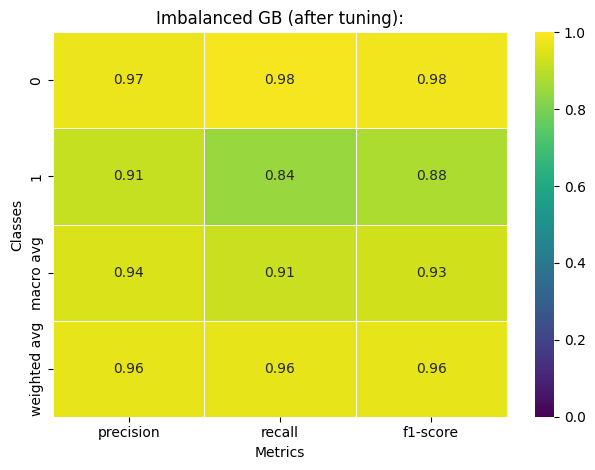

In [ ]:
# print classification report of best performing random forest models
report1 = classification_report(y_test, gb1_updated.predict(X_test), output_dict=True)
# report2 = classification_report(y_test, rf1_updated.predict(X_test), output_dict=True)

def plot_classification_report(report, ax, title):
    report_df = pd.DataFrame.from_dict(report).transpose()
    report_df = report_df.drop("support", axis=1)
    report_df = report_df.drop("accuracy", axis=0)

    sns.heatmap(report_df, annot=True, cmap="viridis", fmt=".2f", linewidths=0.5, vmin=0, vmax=1, ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')

ax1 = plt.subplot()
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# Plot the first heatmap on the first subplot with a custom title
plot_classification_report(report1, ax1, "Imbalanced GB (after tuning):")

# Plot the second heatmap on the second subplot with a custom title
# plot_classification_report(report2, ax2, "Imbalanced RF (after tuning):")

# Set a common title for both subplots
# fig.suptitle('Comparison of Classification Reports on Unnormalized Data', fontsize=16)

plt.tight_layout()
plt.show()